# This notebook goes through all steps of registration and analysis of the subset of the data for Sample 68

# Import needed packages and functions

In [1]:
import numpy as np
import pandas as pd
import os
import socket
import platform
from pathlib import Path
import time
import glob
import re
import gc
import shutil
import cv2
import sys
import pickle
import copy

import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec

from dask.distributed import Client, LocalCluster
from dask.distributed import as_completed
from IPython.display import IFrame
from ClusterWrap.clusters import janelia_lsf_cluster

from struct import unpack, pack
from tqdm.notebook import tqdm
from scipy.sparse import csr_matrix

from skimage.transform import ProjectiveTransform, AffineTransform, EuclideanTransform, warp
from sklearn.linear_model import (LinearRegression,
                                  TheilSenRegressor,
                                  RANSACRegressor,
                                  HuberRegressor,
                                  RidgeCV,
                                  LassoCV)

from scipy.ndimage import gaussian_filter
from scipy import signal
from scipy.signal import convolve2d
from scipy import sparse
from scipy.sparse.linalg import lsqr
from collections import defaultdict
from scipy.signal import savgol_filter

import mrcfile
try:
    import skimage.external.tifffile as tiff
except:
    import tifffile as tiff

from FIBSEM_gs_py.FIBSEM_gs import FIBSEM_frame, bin_crop_mrc_stack, Single_Image_Noise_Statistics
from FIBSEM_gs_py.FIBSEM_gs import split_and_diagonal_bin, Two_Image_FSC

from FIBSEM_gs_py.FIBSEM_help_functions_gs import (check_DASK,
                                                    gauss_without_offset,
                                                    find_FWHM,
                                                    dask_remove_file,
                                                    elapsed_since,
                                                    get_process_memory,
                                                    format_bytes,
                                                    read_kwargs_xlsx,
                                                    get_min_max_thresholds,
                                                    convert_tr_matr_into_deformation_field,
                                                    calculate_gradient_map,
                                                    calculate_image_contrast,
                                                    parse_metadata_file,
                                                    read_image_coordinates)

from FIBSEM_gs_py.FIBSEM_gs import (ShiftTransform,
                        RotationShiftTransform,
                        XScaleShiftTransform,
                        ScaleShiftTransform,
                        AffineTransform,
                        RegularizedAffineTransform)

from  FIBSEM_gs_py.FIBSEM_mosaic_dataset_gs import (build_weight_array,
                                                    transform_tile,
                                                    overlay_montage_grid,
                                                    remap_tile,
                                                    find_Transform_ECC,
                                                    find_Transform_ECC_DASK,
                                                    FIBSEM_mosaic_dataset,
                                                    generate_report_mill_rate_montage_parquet,
                                                    generate_report_data_minmax_montage_parquet,
                                                    generate_report_SEM_param_mosaic_layer_parquet,
                                                    generate_report_SEM_param_mosaic_stack_parquet,
                                                    generate_outliers_report)

from FIBSEM_gs_py.tif_stack_to_zarr import (tif_stack_to_zarr, convert_ome_zarr_v2_to_v3, generate_neuroglancer_link)

from skimage import __version__ as skimage_version
print('skimage version: ', skimage_version)
from scipy import __version__ as scipy_version
print('scipy version:   ', scipy_version)
from sklearn import __version__ as sklearn_version
print('sklearn version: ', sklearn_version)
from cv2 import __version__ as cv2_version
print('Open CV version: ', cv2_version)
from FIBSEM_gs_py import __version__ as FIBSEM_gs_py_version
print('FIBSEM_gs_py version: ', FIBSEM_gs_py_version)

skimage version:  0.26.0
scipy version:    1.17.1
sklearn version:  1.8.0
Open CV version:  4.13.0
FIBSEM_gs_py version:  4.1.5


# Define directory, select FLS (source files).

In [2]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'  # folder where the results will be saved

raw_data_dir = '/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL'   # folder where to look for the raw data
scans = ['scan_{:06d}'.format(x) for x in np.arange(9, 1193)]
#mfovs = ['mFOV_{:04d}'.format(x) for x in [5]]
mfovs = ['mFOV_{:04d}'.format(x) for x in [0,1,5,6,7,11,12]]
#mfovs = ['mFOV_{:04d}'.format(x) for x in np.arange(33)]
nmfovs = len(mfovs) 

fls = []
ntarg = nmfovs*91

for j, scan in enumerate(tqdm(scans, desc = 'Collecting SFOV filnames over scans')):
    fls_add = []
    for mfov in mfovs:
        mask = raw_data_dir + '/' + scan + '/mFOVs/' + mfov + '/sfov*.png'
        fls_add += sorted(glob.glob(mask))
        
    if len(fls_add)<ntarg:
        print(f'Scan {scan} does not have {ntarg} SFOVs, skipping')
    else:
        fls += fls_add
        
nfls = len(fls)
ntiles_per_z = 91 * nmfovs
print(nfls, ' files found')
fls_stack = np.array(fls).reshape((nfls//ntiles_per_z, ntiles_per_z))
print('Stack shape: ', fls_stack.shape)

Scan scan_000016 does not have 637 SFOVs, skipping
Scan scan_000028 does not have 637 SFOVs, skipping
Scan scan_000034 does not have 637 SFOVs, skipping
Scan scan_000035 does not have 637 SFOVs, skipping
Scan scan_000039 does not have 637 SFOVs, skipping
Scan scan_000065 does not have 637 SFOVs, skipping
Scan scan_000343 does not have 637 SFOVs, skipping
749749  files found
Stack shape:  (1177, 637)
CPU times: user 9.72 s, sys: 40.9 s, total: 50.6 s
Wall time: 7min 7s


# Save FLS intobinary dump (for faster re-starting)

In [3]:
%%time

fls_dump_filename = dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_fls.bin'
with open(fls_dump_filename, 'wb') as f:
    pickle.dump(fls, f, protocol=pickle.HIGHEST_PROTOCOL)

CPU times: user 172 ms, sys: 92.7 ms, total: 265 ms
Wall time: 488 ms


# Read FLS from binary dump (for faster re-start)

In [2]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'  # folder where the results will be saved
fls_dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_fls.bin'
with open(fls_dump_filename, 'rb') as f:
    fls = pickle.load(f)

nfls = len(fls)
#mfovs = ['mFOV_{:04d}'.format(x) for x in [5]]
mfovs = ['mFOV_{:04d}'.format(x) for x in [0,1,5,6,7,11,12]]
#mfovs = ['mFOV_{:04d}'.format(x) for x in np.arange(33)]
nmfovs = len(mfovs) 
ntiles_per_z = 91 * nmfovs
print(nfls, ' files found')
fls_stack = np.array(fls).reshape((nfls//ntiles_per_z, ntiles_per_z))
print('Stack shape: ', fls_stack.shape)

749749  files found
Stack shape:  (1177, 637)
CPU times: user 153 ms, sys: 108 ms, total: 261 ms
Wall time: 347 ms


# Define Deformation Field to correct for X-axis frame distortions

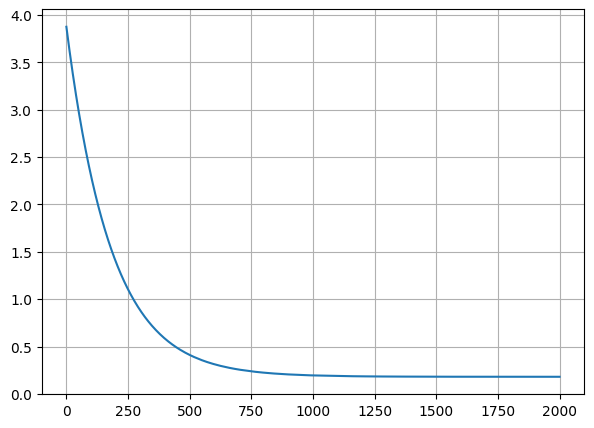

In [3]:
def exp_abc(x, a, b, c):
    return a * np.exp(b * x) + c

popt_abc = np.array([3.69483884697529, -0.005550720068005837, 0.18030818636492463])
left_crop = 0

frame = FIBSEM_frame(fls[0])
h, w = frame.RawImageA.shape

DF = np.zeros((h, w, 2), dtype=np.float32)

for i in range(h):
        DF[i,:, 0] = [exp_abc(x, *popt_abc) + x for x in range(w)]
for j in range(w):
        DF[:,j, 1] = [y for y in range(h)]

fig, ax = plt.subplots(1,1, figsize=(7,5))
ax.plot(DF[100, :, 0] - np.arange(w))
ax.grid(True)

# Example of Noise and Contrast Analysis

Analyzing the Noise Statistics in RawImageA, All Pixels

2026/06/30  10:29:54   The EM data range for display:            78.88 to 119.98
2026/06/30  10:29:54   The EM data range for noise analysis:     81.18 to 113.36

2026/06/30  10:29:55   Used Dark Count Offset: 0.00
Slope of linear fit with header offset: 0.23
Fit w DarkCount  : SNR1f <S²>/<N²> (filtered) = 413.43
Fit w DarkCount  : SNR1a <S²>/<S> (all pts.) = 409.91

Free Fit Offset: 43.06
Slope of Free Fit: 0.42
Free Fit         : SNR0f <S²>/<N²> (filtered) = 124.75
Free Fit         : SNR0a <S²>/<S> (all pts.) = 125.59

2026/06/30  10:30:09   results saved into the file: /nrs/hess/data/sample68_subset_7MFOV_v3/sfov_004_RawImageA_Noise_Analysis_AllPix.png


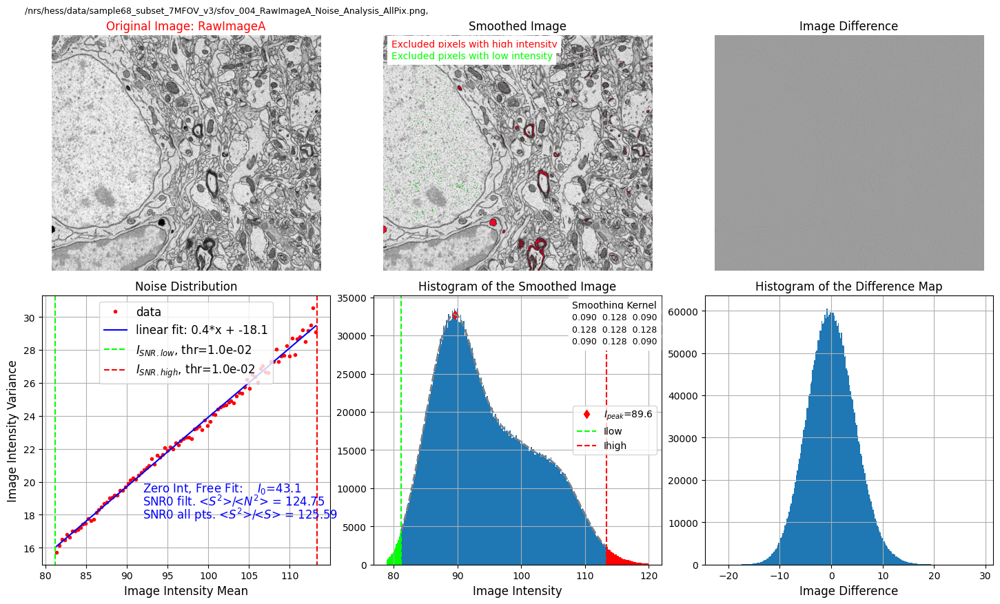


Analyzing the Noise Statistics in RawImageA, Gr.Thr=0.100

2026/06/30  10:30:15   The EM data range for display:            78.88 to 119.98
2026/06/30  10:30:15   The EM data range for noise analysis:     80.13 to 113.06

2026/06/30  10:30:16   Used Dark Count Offset: 0.00
Slope of linear fit with header offset: 0.23
Fit w DarkCount  : SNR1f <S²>/<N²> (filtered) = 414.90
Fit w DarkCount  : SNR1a <S²>/<S> (all pts.) = 415.41

Free Fit Offset: 42.24
Slope of Free Fit: 0.41
Free Fit         : SNR0f <S²>/<N²> (filtered) = 124.73
Free Fit         : SNR0a <S²>/<S> (all pts.) = 130.41

2026/06/30  10:30:28   results saved into the file: /nrs/hess/data/sample68_subset_7MFOV_v3/sfov_004_RawImageA_Noise_Analysis_GrThr0.10.png


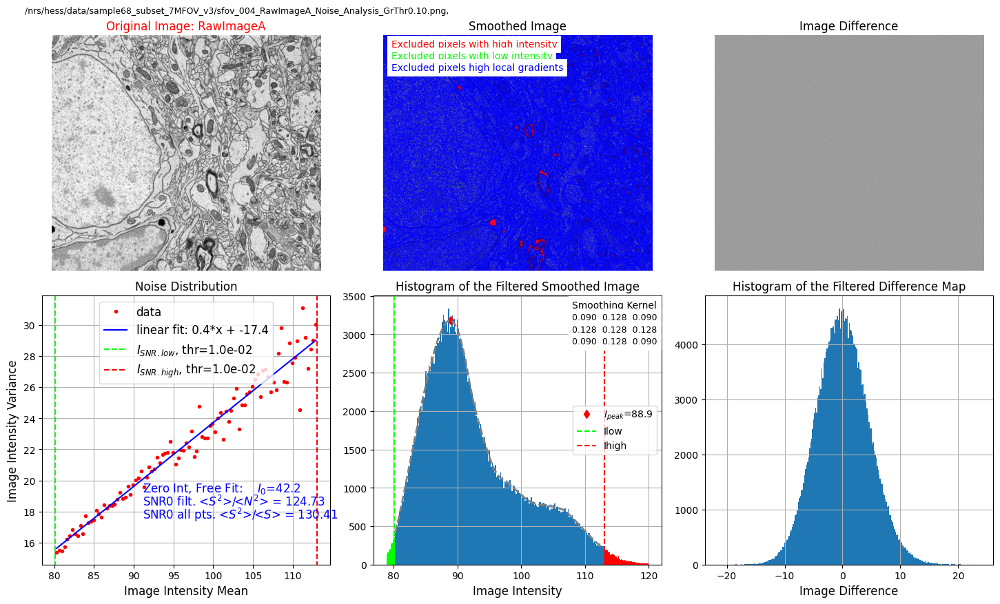


Analyzing the Noise Statistics in RawImageB, All Pixels

Analyzing the Noise Statistics in RawImageB, Gr.Thr=0.100


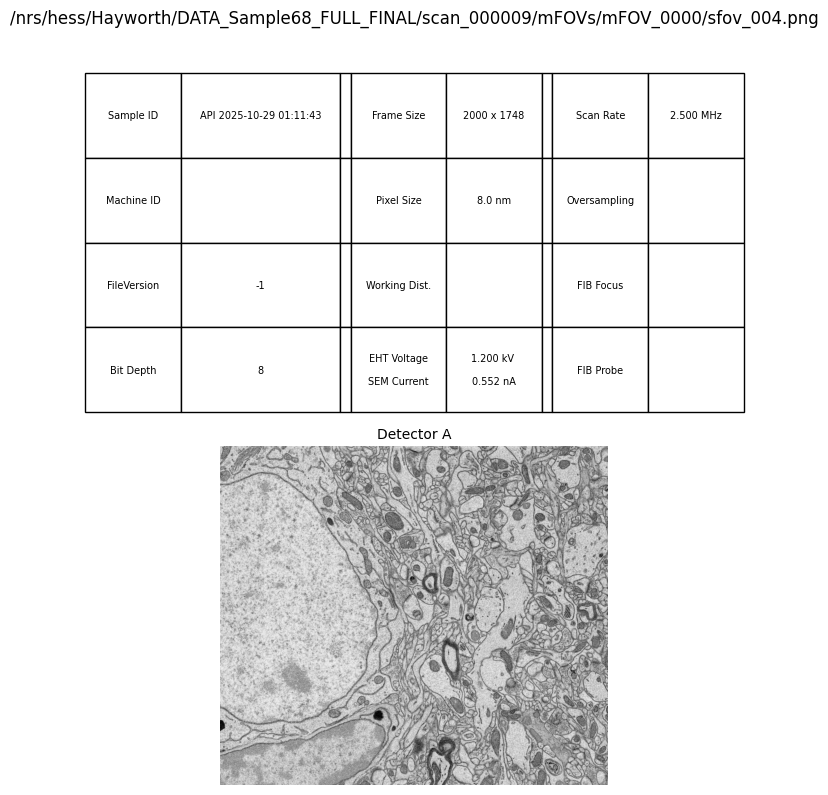

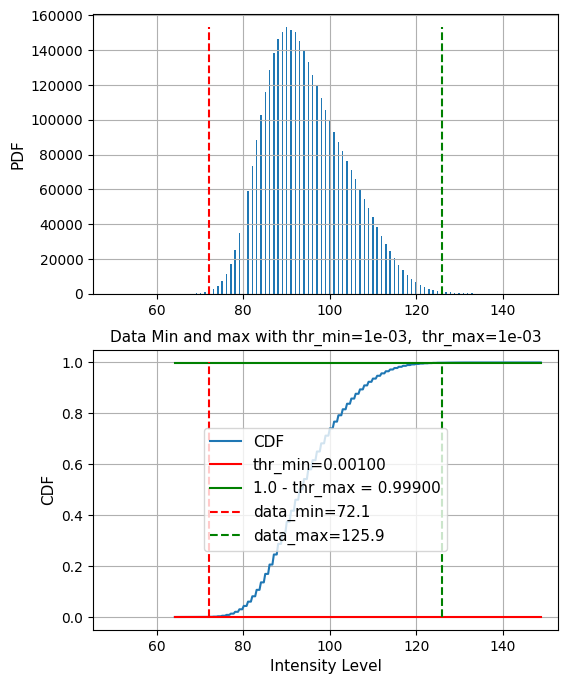

In [6]:
fr_inds = [3]
grad_thr_min = 0.10
nbins = 512

for fr_ind in fr_inds:
    test_frame = FIBSEM_frame(fls_stack[0, fr_ind])
    test_frame_suff = Path(test_frame.fname).suffix
    snapshot_name = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_snapshot.png'))
    test_frame.save_snapshot(snapshot_name=snapshot_name)
    get_min_max_thresholds(test_frame.RawImageA, disp_res=True)
    
    # define filter array for noise calculations. Select only pixels with low local intensity gradients.
    abs_grad = calculate_gradient_map((test_frame.RawImageA-test_frame.Scaling[1,0]), normalize=False, thresholds_disp=[1e-2, 1e-2], disp_res=False)
    gr_min, gr_max = get_min_max_thresholds(abs_grad, nbins=nbins, thr_min=grad_thr_min, disp_res=False)
    filter_array = abs_grad<gr_min
    
    image_name = 'RawImageA'
    res_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis_AllPix.png'))
    print('Analyzing the Noise Statistics in ' + image_name + ', All Pixels')

    RawImageA_results_allpix = test_frame.analyze_noise_statistics(image_name = image_name,
                                                            #filter_array = filter_array,
                                                            disp_res_SNR1 = False,
                                                            res_fname = res_fname,
                                                           dpi=600)
    
    res_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis_GrThr{:.2f}.png'.format(grad_thr_min)))
    print('')
    print('Analyzing the Noise Statistics in ' + image_name + ', Gr.Thr={:.3f}'.format(grad_thr_min))
    
    RawImageA_results_grthr = test_frame.analyze_noise_statistics(image_name = image_name,
                                                            filter_array = filter_array,
                                                            disp_res_SNR1 = False,
                                                            res_fname = res_fname,
                                                           dpi=600)

    image_name = 'RawImageB'
    res_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis_AllPix.png'))
    print('')
    print('Analyzing the Noise Statistics in '+ image_name + ', All Pixels')
    
    RawImageB_results_allpix = test_frame.analyze_noise_statistics(image_name = image_name,
                                                            #filter_array = filter_array,
                                                            disp_res_SNR1 = False,
                                                            res_fname = res_fname,
                                                           dpi=600)
    
    res_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis_GrThr{:.2f}.png'.format(grad_thr_min)))
    print('')
    print('Analyzing the Noise Statistics in ' + image_name + ', Gr.Thr={:.3f}'.format(grad_thr_min))
    
    RawImageB_results_grthr = test_frame.analyze_noise_statistics(image_name = image_name,
                                                            filter_array = filter_array,
                                                            disp_res_SNR1 = False,
                                                            res_fname = res_fname,
                                                           dpi=600)

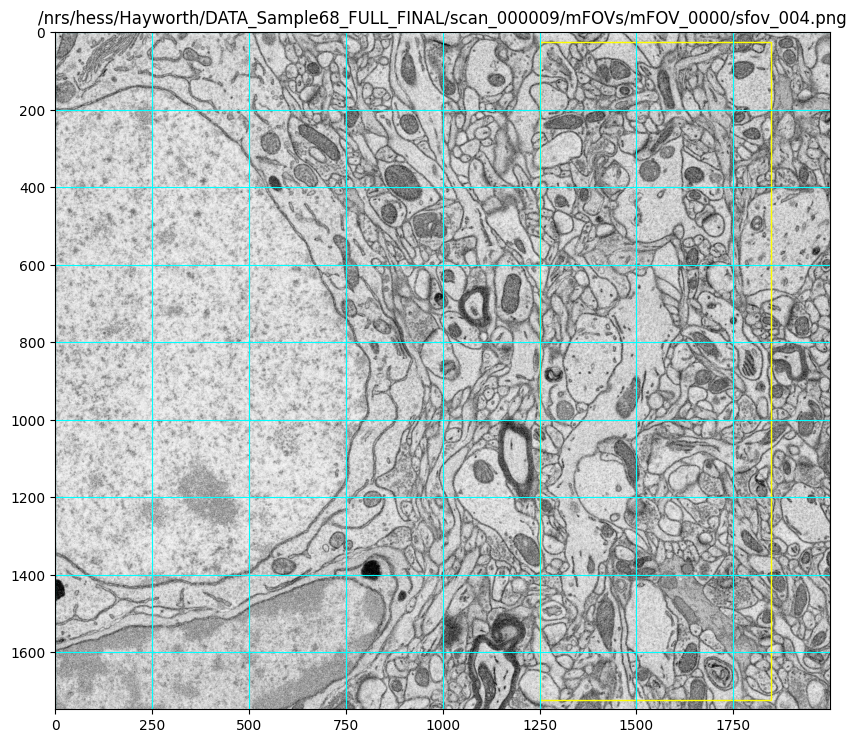

In [7]:
evaluation_box = [25, 1700, 1250, 600]
test_frame_suff = Path(test_frame.fname).suffix
ROI_image_name = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_ROI.png'))
test_frame.show_eval_box(evaluation_box = evaluation_box,
                         save_res_png  = False,
                        res_fname = ROI_image_name)

In [8]:
xi = evaluation_box[2]
xa = xi + evaluation_box[3]
yi = evaluation_box[0]
ya = yi + evaluation_box[1]
test_image = test_frame.RawImageA[yi:ya, xi:xa]


2026/06/30  10:30:34   The EM data range for display:            81.08 to 117.87
2026/06/30  10:30:34   The EM data range for noise analysis:     82.54 to 104.67

2026/06/30  10:30:35   Used Dark Count Offset: 0.00
Slope of linear fit with header offset: 0.22
Fit w DarkCount  : SNR1f <S²>/<N²> (filtered) = 414.43
Fit w DarkCount  : SNR1a <S²>/<S> (all pts.) = 433.92

Free Fit Offset: 40.25
Slope of Free Fit: 0.40
Free Fit         : SNR0f <S²>/<N²> (filtered) = 138.82
Free Fit         : SNR0a <S²>/<S> (all pts.) = 145.71

2026/06/30  10:30:39   results saved into the file: /nrs/hess/data/sample68_subset_7MFOV_v3/sfov_004_ROI_SNR.png


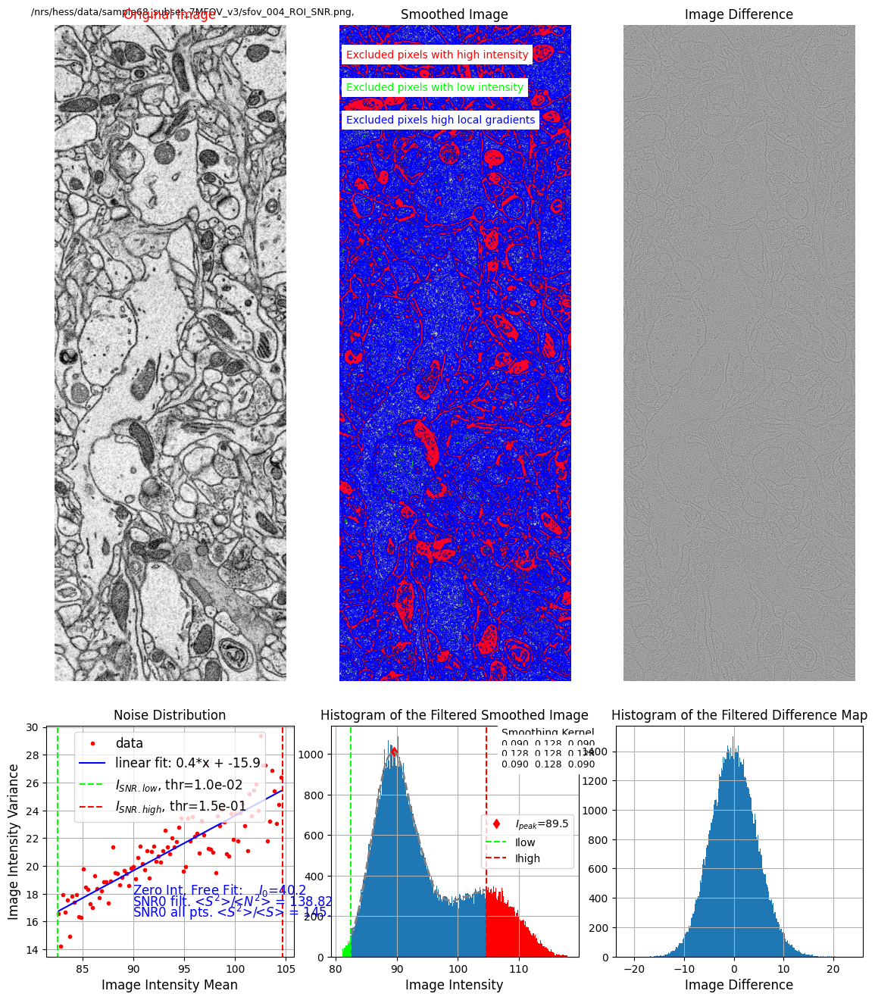

In [9]:

res_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_ROI_SNR.png'))

grad_thr_min = 0.10
nbins = 128
abs_grad = calculate_gradient_map(test_image, normalize=False, thresholds_disp=[1e-2, 1e-2], disp_res=False)
gr_min, gr_max = get_min_max_thresholds(abs_grad, nbins=nbins, thr_min=grad_thr_min, disp_res=False)
filter_array = abs_grad<gr_min

thresholds_SNR_analysis = [0.01, 0.15]

result = Single_Image_Noise_Statistics(test_image,
                                      thresholds_SNR_analysis = thresholds_SNR_analysis,
                                      filter_array = filter_array,
                                      disp_res_SNR1 = False,
                                     save_res_png = True,
                                     res_fname = res_fname)

In [10]:
I0_snr = result['I0']

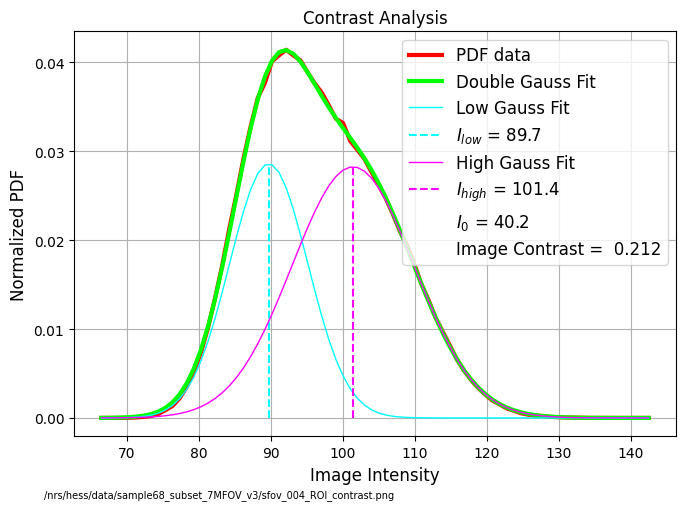

In [23]:
res_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_ROI_contrast.png'))
nbins = 78
contrast, I_high, I_low, I0_contr = calculate_image_contrast(test_image,
                                                             nbins=nbins,
                                                       DarkCount = I0_snr,
                                                       save_res_png = True,
                                                       res_fname = res_fname)

# Example of Resolution Analysis: Fourier Shell Correlation

input images must be squares


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/FIBSEM_gs_py/FIBSEM_help_functions_gs.py:848: RuntimeWarning: invalid value encountered in divide
  radialprofile = tbin / nr


2026/06/30  10:30:42   FSC BW = 0.49262
Saved the results into the file:  /nrs/hess/data/sample68_subset_7MFOV_v3/sfov_004_FSC.png


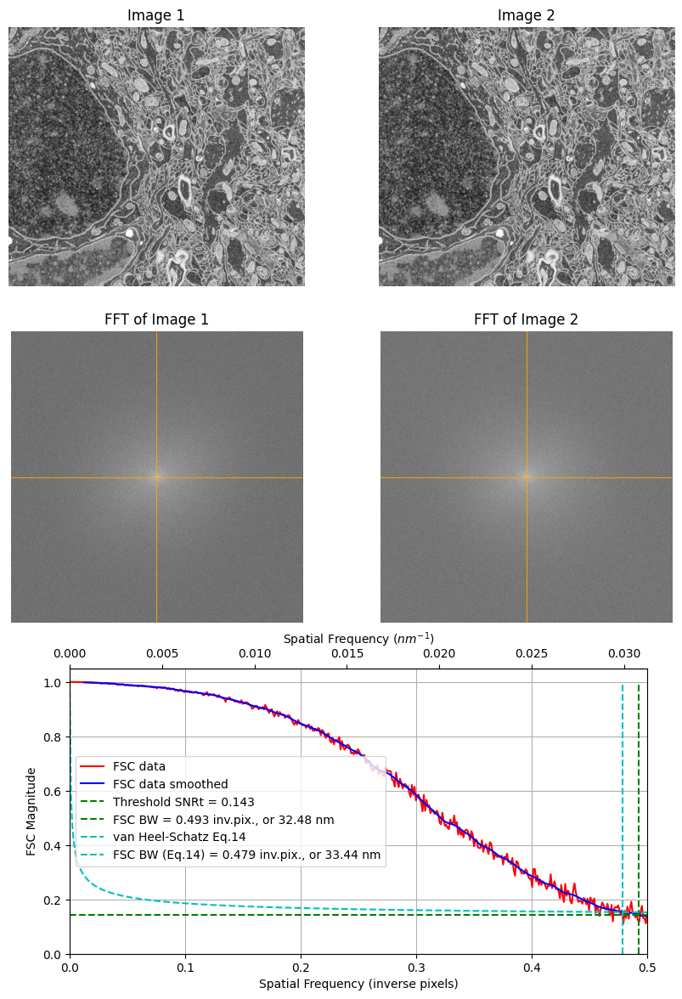

In [12]:
test_frame_suff = Path(test_frame.fname).suffix
save_fname = os.path.join(data_dir, os.path.split(fls_stack[0, fr_ind])[1].replace(test_frame_suff, '_FSC.png'))

test_imagea, test_imageb = split_and_diagonal_bin(test_frame.RawImageA)


res = Two_Image_FSC(test_imagea, test_imageb,
                    pixel = 16.0, # these are down-sampled "half images", so the pixel size is double of the original
                    disp_res = True,
                    save_res_png = True,
                    res_fname = save_fname)

# Initialize an instance of FIBSEM_mosaic_dataset object that has 1177 Z-frames, 91 tiles (SFOVs) each

In [29]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v1.bin'

fnm_mosaic_stack = os.path.join(data_dir, 'sample68_layer.mrc')

test_stack = FIBSEM_mosaic_dataset(fls_stack,
                                   recall_parameters = False,
                                    dump_filename = dump_filename,
                                    data_dir = data_dir,
                                    deformation_field = DF,
                                    fnm_mosaic_stack = fnm_mosaic_stack,
                                    SIFT_contrastThreshold = 0.005,
                                    Lowe_Ratio_Threshold = 0.70,
                                    RANSAC_initial_fraction = 0.05,
                                    max_iter = 100000,
                                    drmax = 3.0,
                                    percentile = 50,
                                    verbose = True,
                                    memory_profiling = True,
                                    max_futures = 100000)

print('Set min_intralayer_overlap_pixels = ', test_stack.min_intralayer_overlap_pixels)
print('Set min_interlayer_overlap_pixels = ', test_stack.min_interlayer_overlap_pixels)

2026/07/02  13:50:55   Started data set initialization
Will use image coordinates files:  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000009/mFOVs/full_image_coordinates.txt , ... ,  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_001192/mFOVs/full_image_coordinates.txt
Will use metadata file:  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000009/mFOVs/mFOV_0000/metadata.txt


Reading image coordinates from .txt files:   0%|          | 0/1177 [00:00<?, ?it/s]

Determining intra-layer pairs:   0%|          | 0/1177 [00:00<?, ?it/s]

Determining inter-layer pairs:   0%|          | 0/1176 [00:00<?, ?it/s]

2026/07/02  13:51:23   Building image pair list


Adding intra-layer horizontal pairs:   0%|          | 0/1177 [00:00<?, ?it/s]

Adding intra-layer vertical pairs:   0%|          | 0/1177 [00:00<?, ?it/s]

Adding inter-layer pairs:   0%|          | 0/1176 [00:00<?, ?it/s]

Determining pair overlap bounds:   0%|          | 0/3306187 [00:00<?, ?it/s]

2026/07/02  13:51:49   Computed index pairs and geometry:
   Xsize: 61021, Ysize: 65686
   Total number of left-right intra-layer pairs:  762696
   Total number of up-down intra-layer pairs:  1373454
   Total number of intra-layer pairs:  2136150
   Total number of inter-layer pairs:  1170037
   Total number of pairwise transformations : 3306187
2026/07/02  13:51:49   Initialized FIBSEM_mosaic_dataset instance:
Total number of tile files: 749749
Number of tiles per Z-layer: 637
Number of Z-slices (nz_tiles): 1177

Total number of left-right intra-layer pairs:  762696
Total number of up-down intra-layer pairs:  1373454
Total number of intra-layer pairs:  2136150
Total number of inter-layer pairs:  1170037
Total number of pairwise transformations : 3306187
Profiling: Start of Execution: RSS:  -8.37GB | VMS:  -8.37GB | SHR       0B | time:   54.63s
Set min_intralayer_overlap_pixels =  69920.0
Set min_interlayer_overlap_pixels =  699200.0
CPU times: user 46.5 s, sys: 1.57 s, total: 48 s
Wa

In [5]:
test_stack.XResolution, test_stack.YResolution, test_stack.XResolution * test_stack.YResolution * 0.02, test_stack.XResolution * 100

(2000, 1748, 69920.0, 200000)

    Previously (without min_intralayer_overlap_pixels and min_interlayer_overlap_pixels):
    
    2026/06/27  12:16:16   Computed index pairs and geometry:
    Xsize: 61021, Ysize: 65686
    Total number of left-right intra-layer pairs:  762696
    Total number of up-down intra-layer pairs:  1397772
    Total number of intra-layer pairs:  2160468
    Total number of inter-layer pairs:  4567735
    Total number of pairwise transformations : 6728203
       
    2026/06/27  12:16:17   Initialized FIBSEM_mosaic_dataset instance:
    Total number of tile files: 749749
    Number of tiles per Z-layer: 637
    Number of Z-slices (nz_tiles): 1177
    
    Total number of left-right intra-layer pairs:  762696
    Total number of up-down intra-layer pairs:  1397772
    Total number of intra-layer pairs:  2160468
    Total number of inter-layer pairs:  4567735
    Total number of pairwise transformations : 6728203

# Analyze FirstPixel Trends and Potential jumps

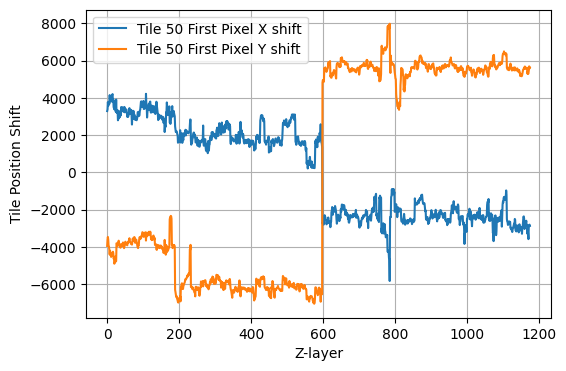

In [30]:
tile_id = 50
FPxs = test_stack.FirstPixels[:, tile_id, 0]
FPys = test_stack.FirstPixels[:, tile_id, 1]

fig, ax = plt.subplots(1,1, figsize = (6,4))
ax.plot(FPxs-np.mean(FPxs), label = 'Tile {:d} First Pixel X shift'.format(tile_id))
ax.plot(FPys-np.mean(FPys), label = 'Tile {:d} First Pixel Y shift'.format(tile_id))
#ax.set_xlim((750, 800))
ax.set_xlabel('Z-layer')
ax.set_ylabel('Tile Position Shift')
ax.legend()
ax.grid(True)

# Looks like we cannot trust the positional metadata. Assuming that intra-layer positional data is correct, try to build the inter-layer data and then entire self.FirstPixels data.

Cluster dashboard link:  http://10.36.107.39:8787/status
Cluster adapting between 1 and 500 workers with 2 cores per worker
*** This cluster has an upper bound cost of 70.0 dollars per hour ***
2026/06/30  13:42:24  determine_interlayer_FirstPixel_drifts:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress
2026/06/30  13:42:24   Extracting key-points (use_existing_data=True)
2026/06/30  13:42:24  extract_keypoints:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress


Running extract_keypoints DASK batches:   0%|          | 0/1 [00:00<?, ?it/s]

2026/06/30  13:42:38   Starting DASK batch 1/1 with 43549 jobs (0 remaining after this batch)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 19.15 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


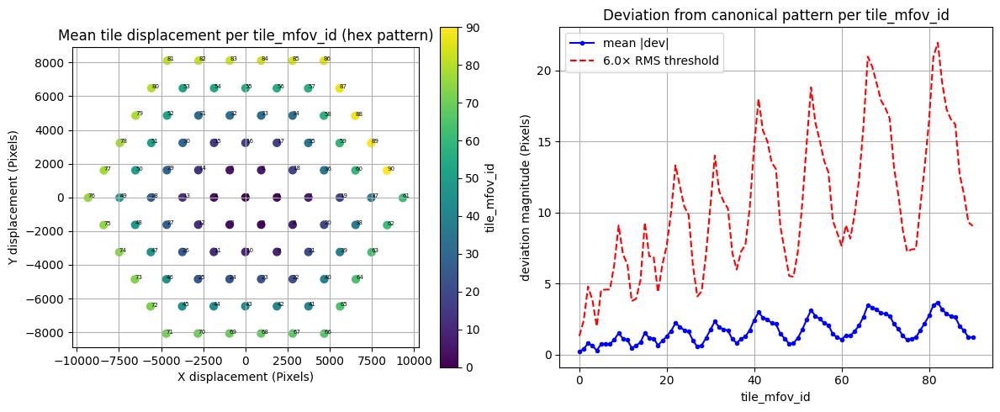

mFOV hex check: 7 mFOV/layer x 1177 layers, 0 outlier tiles (>6.0× RMS)


,Layer,Tile,mfov,tile_mfov_id,deviation,File Path


2026/06/30  13:43:27   position_source=canonical_hex: test tiles span 1 mFOV(s)


Composing per-layer clouds (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/06/30  13:43:27   Compose DASK batch 1/1 (1177 layers)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 16.01 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


Inter-layer rigid shifts (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/06/30  13:44:30   Shift DASK batch 1/1 (1176 pairs)
2026/06/30  13:56:48   Inter-layer FirstPixel drift: 1176/1176 pairs valid (>= 10 inliers)
2026/06/30  13:56:48   Cumulative drift range  dX: [-1552.2, 3459.6]  dY: [-2984.7, 53.1] (pixels)


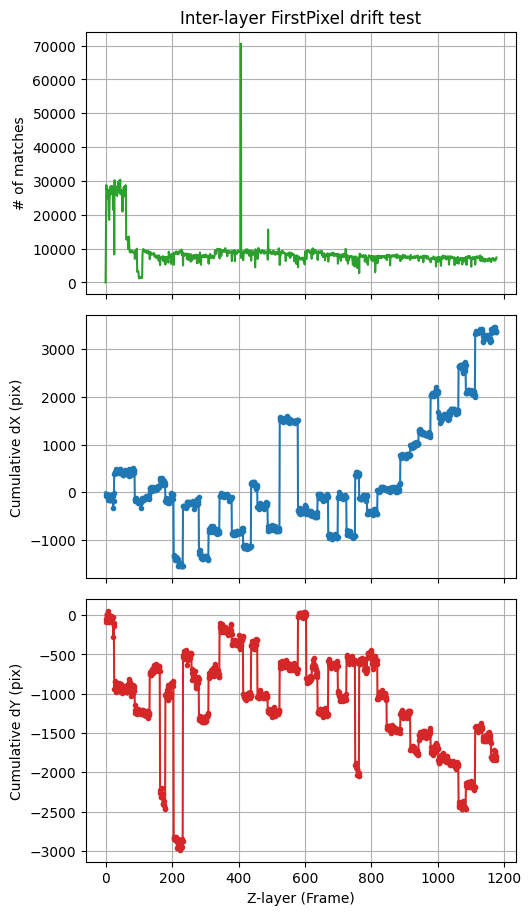

Determining intra-layer pairs:   0%|          | 0/1177 [00:00<?, ?it/s]

Determining inter-layer pairs:   0%|          | 0/1176 [00:00<?, ?it/s]

2026/06/30  13:57:03   Building image pair list


Adding intra-layer horizontal pairs:   0%|          | 0/1177 [00:00<?, ?it/s]

Adding intra-layer vertical pairs:   0%|          | 0/1177 [00:00<?, ?it/s]

Adding inter-layer pairs:   0%|          | 0/1176 [00:00<?, ?it/s]

Determining pair overlap bounds:   0%|          | 0/3215430 [00:00<?, ?it/s]

2026/06/30  13:57:25   Computed index pairs and geometry:
   Xsize: 55922, Ysize: 53653
   Total number of left-right intra-layer pairs:  762696
   Total number of up-down intra-layer pairs:  1370028
   Total number of intra-layer pairs:  2132724
   Total number of inter-layer pairs:  1082706
   Total number of pairwise transformations : 3215430
2026/06/30  13:57:25   self.FirstPixels updated (position_source=canonical_hex) and geometry recomputed.
CPU times: user 2min 14s, sys: 12.4 s, total: 2min 27s
Wall time: 15min 2s


In [7]:
%%time

#test_tile_ids=np.arange(19)
test_tile_ids=np.arange(37)
out_dir = os.path.join(data_dir, 'FirstPixel_drifts')

ncpus = 2
processes = 1
threads = 1
min_workers = 1
max_workers = 500
walltime = '7:59'

'''
with Client(n_workers = 8, threads_per_worker=1) as client:
    test_stack.extract_keypoints(DASK_client = client,
                                        #deformation_field = DF_abs,
                                         #left_crop = left_crop,
                                        use_existing_data = False)
'''

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    FirstPixel_drifts1 = test_stack.determine_interlayer_FirstPixel_drifts(test_tile_ids = test_tile_ids,
                                                                            DASK_client = cluster.client,
                                                                            position_source = 'canonical_hex',
                                                                            update_FirstPixel_data = True,
                                                                            out_dir = out_dir,
                                                                            solver = 'LinReg',
                                                                            use_existing_data = True,
                                                                            verbose = True)

    Previously (without min_intralayer_overlap_pixels and min_interlayer_overlap_pixels):

    2026/06/27  12:33:22   Computed index pairs and geometry:
    Xsize: 55922, Ysize: 53653
    Total number of left-right intra-layer pairs:  762696
    Total number of up-down intra-layer pairs:  1370028
    Total number of intra-layer pairs:  2132724
    Total number of inter-layer pairs:  5024823
    Total number of pairwise transformations : 7157547

# Evaluate all - frames - determine intensities

In [12]:
%%time

ncpus = 1
processes = 1
threads = 1
min_workers = 1
max_workers = 500
walltime = '7:59'

'''
with Client(n_workers = 8, threads_per_worker=1) as client:
    test_stack.extract_keypoints(DASK_client = client,
                                        #deformation_field = DF_abs,
                                         #left_crop = left_crop,
                                        use_existing_data = False)
'''

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    FIBSEM_data = test_stack.evaluate_FIBSEM_statistics(DASK_client = cluster.client,
                                                        use_existing_data = True,
                                                        analyze_SNR = True,
                                                        verbose = False)

Cluster dashboard link:  http://10.36.107.26:8787/status
Cluster adapting between 1 and 500 workers with 1 cores per worker
*** This cluster has an upper bound cost of 35.0 dollars per hour ***
2026/07/02  16:52:39  evaluate_FIBSEM_statistics:  DASK client exists. Will perform distributed computations
Use http://h07u16.int.janelia.org:8787/status to monitor DASK progress
CPU times: user 2.02 s, sys: 474 ms, total: 2.49 s
Wall time: 3.24 s


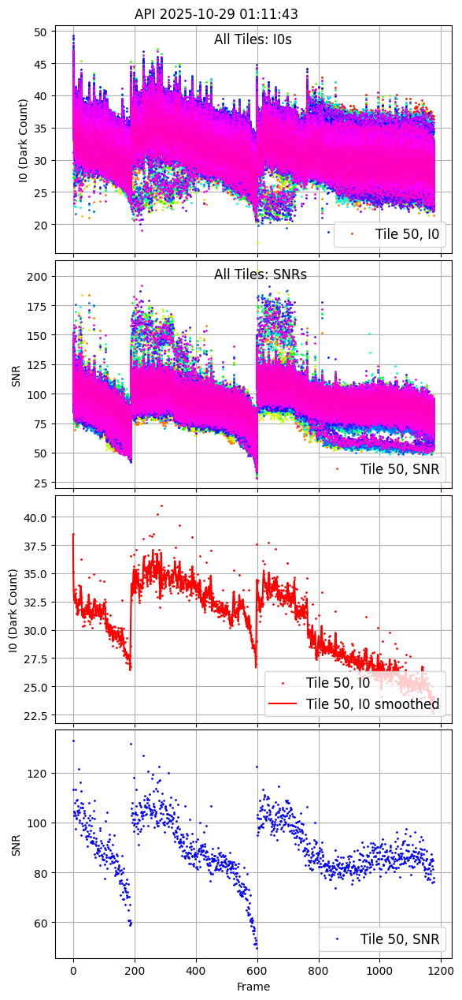

'/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_layer_I0s_SNRs.png'

In [10]:
test_stack.generate_I0_SNR_report(fit_params=['SG', 7, 3], tile_id=50)

In [11]:
%%time
target_ratios = test_stack.compute_detector_target_intensity_ratios(method='percentile', verbose=True)

Parsed 91 unique detector IDs; 91 retained (>= 5 tiles each).
Target ratios: 3215430/3215430 pairs valid, range [0.8545, 1.1608]
CPU times: user 5.92 s, sys: 2.89 ms, total: 5.92 s
Wall time: 5.94 s


# Assemble layer mosaic using image_coordinates.txt - test

In [12]:
%%time

layer_id = 150

snapshot_fname = os.path.join(data_dir, 'layer{:d}_original_snapshot.png'.format(layer_id))
dat_fname = snapshot_fname.replace('_snapshot.png', '.dat')
image_fname = snapshot_fname.replace('_original_snapshot.png', '_w_grid.jpg')

with Client() as client:
    layer_mosaic_orig, layer_id = test_stack.assemble_layer_mosaic(layer_id,
                                            DASK_client = client,
                                            perform_intensity_normalization = False,
                                            use_default_coordinates = True,
                                            thr_min = 0.41,
                                            bin_factor = 1,
                                            overlay_tile_grid = True,
                                            add_tile_ids = True,
                                            tile_id_fontsize = 6,
                                            verbose = False,
                                            save_snapshot = False,                                                 
                                            snapshot_fname = snapshot_fname,
                                            save_to_dat = False,
                                            dat_fname = dat_fname,
                                            save_images = True,
                                            image_fname = image_fname,
                                            dpi = 1200)

2026/06/30  13:57:42  assemble_layer_mosaic:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress


Assembling RawImageA mosaic layer:   0%|          | 0/637 [00:00<?, ?it/s]

2026-06-30 13:57:47,721 - tornado.application - ERROR - Uncaught exception GET /status/ws (10.123.1.66)
HTTPServerRequest(protocol='http', host='10.36.107.39:8787', method='GET', uri='/status/ws', version='HTTP/1.1', remote_ip='10.123.1.66')
Traceback (most recent call last):
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/websocket.py", line 965, in _accept_connection
    open_result = handler.open(*handler.open_args, **handler.open_kwargs)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/web.py", line 3409, in wrapper
    return method(self, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/bokeh/server/views/ws.py", line 149, in open
    raise ProtocolError("Token is expired. Configure the app with a larger value for --session-token-expiration if necessary")
bo

Detector:, data range: vmin=49.02, vmax=75.03
CPU times: user 3min 38s, sys: 15min 58s, total: 19min 36s
Wall time: 19min 25s


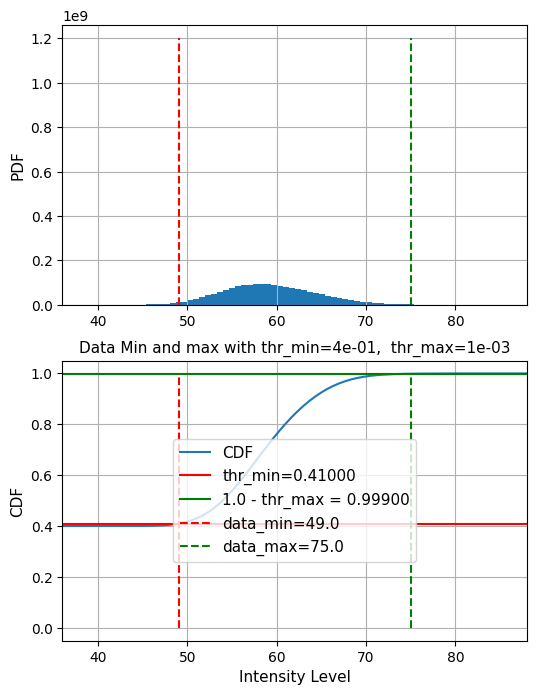

In [13]:
vmin, vmax = get_min_max_thresholds(layer_mosaic_orig[0], thr_min=0.41, disp_res=True)

# Check SIFT performance - optimize SIFT parameters if needed

In [14]:
res = test_stack.find_tile_pairs(250, 50)

,Pair Index,Layer 0,Tile 0,Layer 1,Tile 1,SIFT x-shift,SIFT y-shift,SIFT nmatches,SIFT valid,ECC x-shift,ECC y-shift,ECC valid,overlap_areas
0,162029,250,50,250,29,0.0,0.0,0,False,0.0,0.0,False,236587
1,162050,250,77,250,50,0.0,0.0,0,False,0.0,0.0,False,231925
2,1053796,250,28,250,50,0.0,0.0,0,False,0.0,0.0,False,141362
3,1053797,250,49,250,50,0.0,0.0,0,False,0.0,0.0,False,132429
4,1053799,250,50,250,51,0.0,0.0,0,False,0.0,0.0,False,131791
5,1053835,250,50,250,78,0.0,0.0,0,False,0.0,0.0,False,138170
6,2360480,249,50,250,50,0.0,0.0,0,False,0.0,0.0,False,3403413
7,2361381,250,50,251,50,0.0,0.0,0,False,0.0,0.0,False,3457469


2026/06/30  14:20:10   Will perform SIFT evaluation using following parameters (kpt_kwargs):
{'ftype': 2, 'thr_min': 0.001, 'thr_max': 0.001, 'nbins': 256, 'SIFT_nfeatures': 0, 'SIFT_nOctaveLayers': 3, 'SIFT_contrastThreshold': 0.005, 'SIFT_edgeThreshold': 10, 'SIFT_sigma': 1.6, 'left_crop': 0, 'use_existing_data': False, 'save_deformed_image': True, 'interpolation': 1, 'fill_value': 0, 'verbose': True}


Extracting Key Points and Descriptors:   0%|          | 0/2 [00:00<?, ?it/s]

2026/06/30  14:20:10   Deformation Field is present. Will perform image deformation first.
2026/06/30  14:20:11   File:  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000265/mFOVs/mFOV_0000/sfov_051.png , extracted 51244 keypoints
2026/06/30  14:20:11   Deformation Field is present. Will perform image deformation first.
2026/06/30  14:20:11   File:  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000266/mFOVs/mFOV_0000/sfov_051.png , extracted 51434 keypoints
Key-points files:
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000265/mFOVs/mFOV_0000/sfov_051_kpdes.bin
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000266/mFOVs/mFOV_0000/sfov_051_kpdes.bin
Deformed Image files:
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000265/mFOVs/mFOV_0000/sfov_051_def_image.tif
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000266/mFOVs/mFOV_0000/sfov_051_def_image.tif
Key-point matches file:
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000265/mFOVs/mFOV_0000/sfov_051_sfov_051_matche

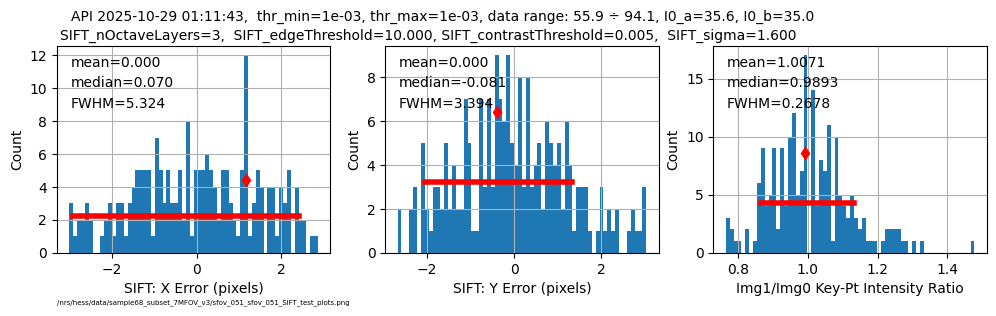

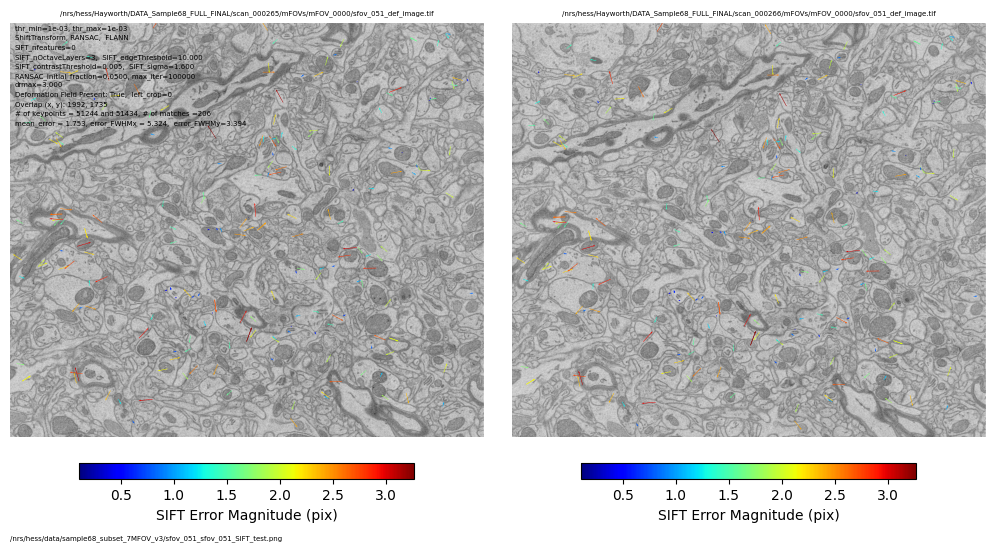

In [15]:
%%time
pair_id = 2361381
fnm_deformed1, fnm_deformed2, transformations_result, int_results = test_stack.SIFT_evaluation(test_stack.index_pairs[pair_id],
                         verbose = True,
                         save_res_png = True)

# The cell below is a previous result - with a lot of inter-layer pairs (that are low-overlap pairs)

In [22]:
res = test_stack.find_tile_pairs(250, 50)

,Pair Index,Layer 0,Tile 0,Layer 1,Tile 1,SIFT x-shift,SIFT y-shift,SIFT nmatches,SIFT valid
0,20029,250,50,250,29,0.0,0.0,0,False
1,20050,250,77,250,50,0.0,0.0,0,False
2,134260,250,28,250,50,0.0,0.0,0,False
3,134261,250,49,250,50,0.0,0.0,0,False
4,134263,250,50,250,51,0.0,0.0,0,False
5,134294,250,50,250,78,0.0,0.0,0,False
6,422123,249,28,250,50,0.0,0.0,0,False
7,422129,249,29,250,50,0.0,0.0,0,False
8,422267,249,49,250,50,0.0,0.0,0,False
9,422274,249,50,250,50,0.0,0.0,0,False


In [27]:
res = test_stack.find_tile_pairs(100, 50)

,Pair Index,Layer 0,Tile 0,Layer 1,Tile 1,SIFT x-shift,SIFT y-shift,SIFT nmatches,SIFT valid
0,64829,100,50,100,29,0.0,0.0,0,False
1,64850,100,77,100,50,0.0,0.0,0,False
2,879196,100,28,100,50,0.0,0.0,0,False
3,879197,100,49,100,50,0.0,0.0,0,False
4,879199,100,50,100,51,0.0,0.0,0,False
5,879235,100,50,100,78,0.0,0.0,0,False
6,2556757,99,28,100,50,0.0,0.0,0,False
7,2556763,99,29,100,50,0.0,0.0,0,False
8,2556902,99,49,100,50,0.0,0.0,0,False
9,2556909,99,50,100,50,0.0,0.0,0,False


In [16]:
res = test_stack.find_tile_pairs(100, 50)

,Pair Index,Layer 0,Tile 0,Layer 1,Tile 1,SIFT x-shift,SIFT y-shift,SIFT nmatches,SIFT valid,ECC x-shift,ECC y-shift,ECC valid,overlap_areas
0,64829,100,50,100,29,0.0,0.0,0,False,0.0,0.0,False,236587
1,64850,100,77,100,50,0.0,0.0,0,False,0.0,0.0,False,231925
2,879196,100,28,100,50,0.0,0.0,0,False,0.0,0.0,False,141362
3,879197,100,49,100,50,0.0,0.0,0,False,0.0,0.0,False,132429
4,879199,100,50,100,51,0.0,0.0,0,False,0.0,0.0,False,131791
5,879235,100,50,100,78,0.0,0.0,0,False,0.0,0.0,False,138170
6,2223409,99,50,100,50,0.0,0.0,0,False,0.0,0.0,False,3359461
7,2224310,100,50,101,50,0.0,0.0,0,False,0.0,0.0,False,3391404


2026/06/30  14:20:34   Will perform SIFT evaluation using following parameters (kpt_kwargs):
{'ftype': 2, 'thr_min': 0.001, 'thr_max': 0.001, 'nbins': 256, 'SIFT_nfeatures': 0, 'SIFT_nOctaveLayers': 3, 'SIFT_contrastThreshold': 0.005, 'SIFT_edgeThreshold': 10, 'SIFT_sigma': 1.6, 'left_crop': 0, 'use_existing_data': False, 'save_deformed_image': True, 'interpolation': 1, 'fill_value': 0, 'verbose': True}


Extracting Key Points and Descriptors:   0%|          | 0/2 [00:00<?, ?it/s]

2026/06/30  14:20:34   Deformation Field is present. Will perform image deformation first.
2026/06/30  14:20:34   File:  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000114/mFOVs/mFOV_0000/sfov_051.png , extracted 50131 keypoints
2026/06/30  14:20:35   Deformation Field is present. Will perform image deformation first.
2026/06/30  14:20:35   File:  /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000115/mFOVs/mFOV_0000/sfov_051.png , extracted 49419 keypoints
Key-points files:
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000114/mFOVs/mFOV_0000/sfov_051_kpdes.bin
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000115/mFOVs/mFOV_0000/sfov_051_kpdes.bin
Deformed Image files:
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000114/mFOVs/mFOV_0000/sfov_051_def_image.tif
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000115/mFOVs/mFOV_0000/sfov_051_def_image.tif
Key-point matches file:
/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000114/mFOVs/mFOV_0000/sfov_051_sfov_051_matche

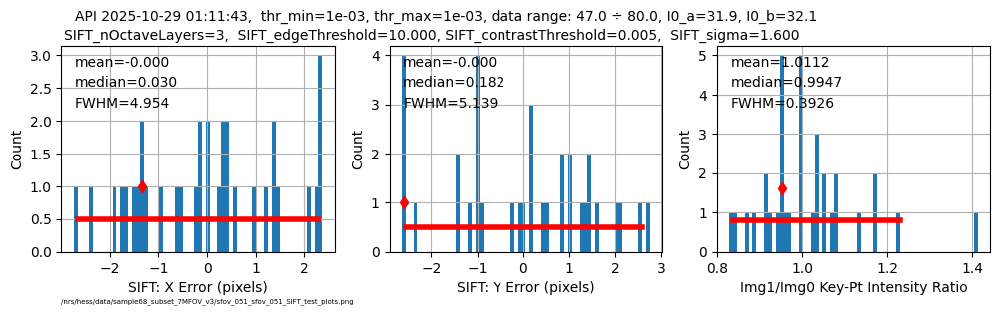

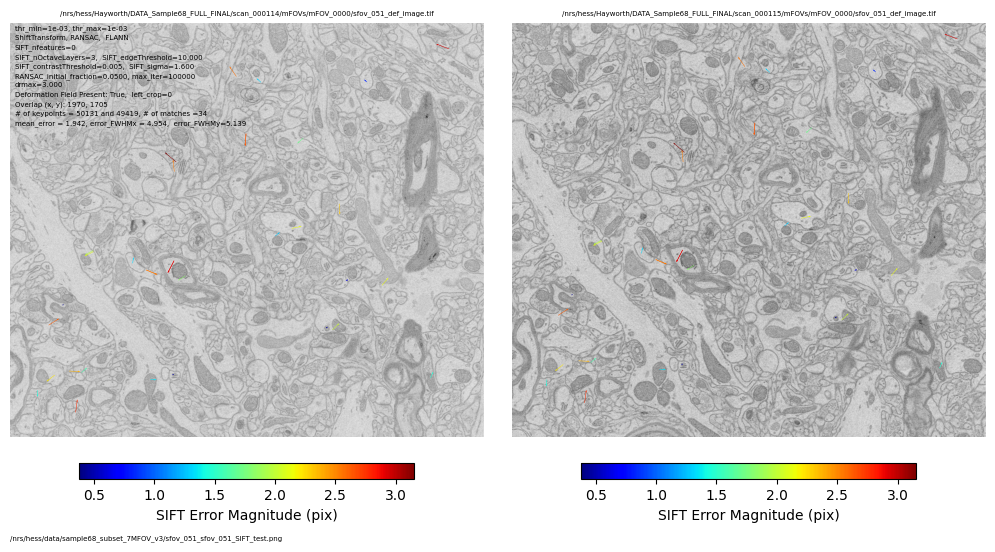

In [17]:
%%time
pair_id = 2223409
fnm_deformed1, fnm_deformed2, transformations_result, int_results = test_stack.SIFT_evaluation(test_stack.index_pairs[pair_id],
                           Lowe_Ratio_Threshold=0.75,
                           RANSAC_initial_fraction=0.05,
                            drmax=3.0,
                         verbose = True,
                         save_res_png = True)

# Perform SIFT step1: Extract Key-Points

In [18]:
%%time

ncpus = 1
processes = 1
threads = 1
min_workers = 1
max_workers = 2000
walltime = '7:59'

'''
with Client(n_workers = 8, threads_per_worker=1) as client:
    test_stack.extract_keypoints(DASK_client = client,
                                        #deformation_field = DF_abs,
                                         #left_crop = left_crop,
                                        use_existing_data = False)
'''

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:

    test_stack.extract_keypoints(DASK_client=cluster.client,
                                            use_existing_data = True)

Cluster dashboard link:  http://10.36.107.39:8787/status
Cluster adapting between 1 and 2000 workers with 1 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/06/30  14:20:55  extract_keypoints:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress


Running extract_keypoints DASK batches:   0%|          | 0/8 [00:00<?, ?it/s]

2026/06/30  14:21:10   Starting DASK batch 1/8 with 100000 jobs (649749 remaining after this batch)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 43.97 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


2026/06/30  14:23:16   Starting DASK batch 2/8 with 100000 jobs (549749 remaining after this batch)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 43.97 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


2026/06/30  14:25:19   Starting DASK batch 3/8 with 100000 jobs (449749 remaining after this batch)
2026/06/30  14:27:24   Starting DASK batch 4/8 with 100000 jobs (349749 remaining after this batch)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 43.97 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


2026/06/30  14:29:33   Starting DASK batch 5/8 with 100000 jobs (249749 remaining after this batch)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 43.97 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


2026/06/30  14:32:11   Starting DASK batch 6/8 with 100000 jobs (149749 remaining after this batch)
2026/06/30  14:34:35   Starting DASK batch 7/8 with 100000 jobs (49749 remaining after this batch)
2026/06/30  14:36:53   Starting DASK batch 8/8 with 49749 jobs (0 remaining after this batch)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 21.88 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
Exception in callback multi_future.<locals>.callback(<Task cancell...ession.py:77>>) at /groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/gen.py:540
handle: <Handle multi_future.<locals>.callback(<Task cancell...ession.py:77>>) at /groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/gen.py:540>
Traceback (most recent call last):
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "/groups/hess/home/shtengelg/anaco

CPU times: user 15min 55s, sys: 1min 28s, total: 17min 23s
Wall time: 17min 54s


# Check for outliers (unusualy low/high # of key-points)

/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/matplotlib/transforms.py:195: RuntimeWarning: coroutine 'WSHandler.send_message' was never awaited
  ref = weakref.ref(


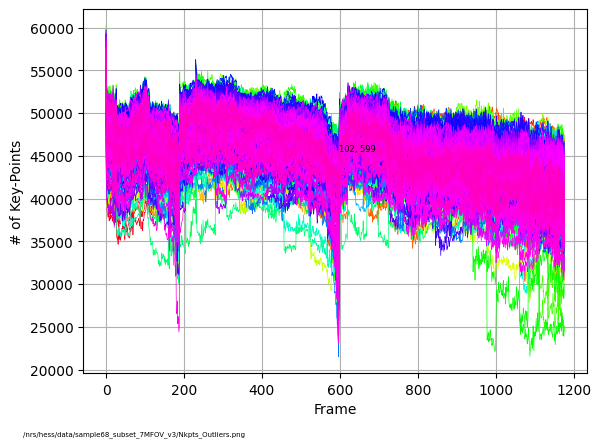

Building Outlier Report:   0%|          | 0/1 [00:00<?, ?it/s]

Outlier Frame: 599 Tile: 102   /nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/scan_000615/mFOVs/mFOV_0001/sfov_012.png


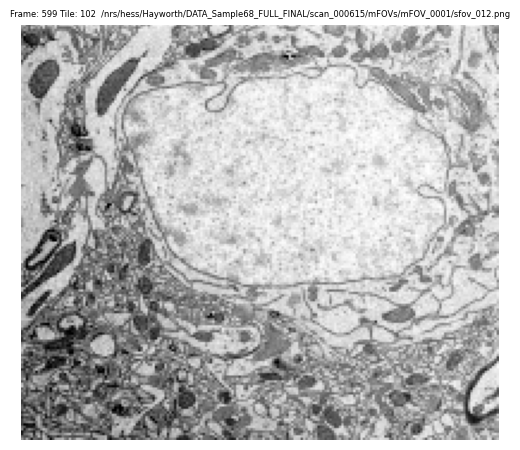

In [19]:
save_fname = os.path.join(data_dir, 'Nkpts_Outliers.png')
outliers_nkpts = test_stack.analyze_kpt_statistics(sigma_thr=14.0, save_fname=save_fname)
generate_outliers_report(outliers_nkpts, data_dir=data_dir)

# Read bad frames from outliers_thumbnails folder

In [ ]:
outliers_folder = '/nrs/hess/data/sample68_subset/outliers_thumbnails'
fls_thumbnails = np.array(sorted(glob.glob(outliers_folder + '/*.png')))
fls_short = np.array([os.path.split(fl)[-1] for fl in test_stack.fls.ravel()]).reshape(test_stack.fls.shape)
bad_files = []
for fl_thumbnail in tqdm(fls_thumbnails):
    fl_thumbnail_short = os.path.split(fl_thumbnail)[-1].replace('_thumbnail.png', '.dat')
    bad_files.append(test_stack.fls[fls_short==fl_thumbnail_short][0])

bad_files

# Substitute Bad Frames (.fls and .fnms_kpts)

In [ ]:
bad_frames = ['/nrs/hess/mpi/Y2026/M04/D07/Merlin-6262_26-04-07_051706_0-4-1.dat']

fls_amended = copy.deepcopy(test_stack.fls)
fnms_kpts_amended = copy.deepcopy(test_stack.fnms_kpts)

for bad_frame in tqdm(bad_files):
    ind = np.argwhere(test_stack.fls==bad_frame)
    fls_amended[ind[0][0], ind[0][1]] = test_stack.fls[ind[0][0]-1, ind[0][1]]
    print('Index ', ind,' susbsitute frame', test_stack.fls[ind[0][0], ind[0][1]], 'with ', test_stack.fls[ind[0][0]-1, ind[0][1]])
    fnms_kpts_amended[ind[0][0], ind[0][1]] = test_stack.fnms_kpts[ind[0][0]-1, ind[0][1]]
    print('Index ', ind,' susbsitute frame', test_stack.fnms_kpts[ind[0][0], ind[0][1]], 'with ', test_stack.fnms_kpts[ind[0][0]-1, ind[0][1]])
    print()
    
fls_amended.shape, fnms_kpts_amended.shape

# Save Current State 

In [ ]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v2.bin'
dump_f = test_stack.save_parameters(dump_filename = dump_filename)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Dataset Object Data saved into binary dump file:')
print(dump_f)

# Perform SIFT step2: Determine pair-wise transformations for adjacent frame pairs

In [20]:
%%time

ncpus = 1
processes = 1
threads = 1
min_workers = 1
max_workers = 2000
walltime = '7:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:

    transformations_results_SIFT = test_stack.determine_transformations_SIFT(DASK_client = cluster.client,
                                                                                        Lowe_Ratio_Threshold = 0.70,
                                                                                        SIFT_nmatches_min = 10,
                                                                                        solver='RANSAC', 
                                                                                        use_existing_data = False,
                                                                                        verbose = False)

Cluster dashboard link:  http://10.36.107.39:8787/status
Cluster adapting between 1 and 2000 workers with 1 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/06/30  14:38:54  determine_transformations_SIFT:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress


Setting up SIFT parameter list:   0%|          | 0/3215430 [00:00<?, ?it/s]

Running determine_transformations_SIFT DASK batches:   0%|          | 0/33 [00:00<?, ?it/s]

/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 118.44 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 118.65 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of siz

2026/06/30  19:12:57   Mean Number of Matched Keypoints for intra-layer horisontal matches : 258
2026/06/30  19:12:57   Mean Number of Matched Keypoints for intra-layer vertical matches : 130
2026/06/30  19:12:57   Mean Number of Matched Keypoints for inter-layer matches : 144
2026/06/30  19:12:57   3201063 out of 3215430 SIFT transformations are valid  (SIFT_nmatches > 10)
CPU times: user 2h 23min 24s, sys: 20min 57s, total: 2h 44min 22s
Wall time: 4h 34min 49s


In [21]:
n_valid = np.sum(test_stack.SIFT_transformation_valid)
nh, nv = test_stack.nh, test_stack.nv
mean_h     = np.mean(test_stack.SIFT_nmatches[:nh])
mean_v     = np.mean(test_stack.SIFT_nmatches[nh:nh+nv])
mean_inter = np.mean(test_stack.SIFT_nmatches[nh+nv:]) if test_stack.nl > 0 else np.nan
n_valid    = int(np.sum(test_stack.SIFT_transformation_valid))
print('Mean Number of Matched Keypoints for intra-layer horisontal matches : ', mean_h)
print('Mean Number of Matched Keypoints for intra-layer vertical matches   : ', mean_v)
print('Mean Number of Matched Keypoints for inter-layer matches            : ', mean_inter)
print('{:d} out of {:d} SIFT transformations are valid'.format(n_valid, test_stack.C))

Mean Number of Matched Keypoints for intra-layer horisontal matches :  258.3574412347777
Mean Number of Matched Keypoints for intra-layer vertical matches   :  130.7800782173795
Mean Number of Matched Keypoints for inter-layer matches            :  144.32034181024213
3201063 out of 3215430 SIFT transformations are valid


In [34]:
n_valid = np.sum(test_stack.SIFT_transformation_valid)
nh, nv = test_stack.nh, test_stack.nv
mean_h     = np.mean(test_stack.SIFT_nmatches[:nh])
mean_v     = np.mean(test_stack.SIFT_nmatches[nh:nh+nv])
mean_inter = np.mean(test_stack.SIFT_nmatches[nh+nv:]) if test_stack.nl > 0 else np.nan
n_valid    = int(np.sum(test_stack.SIFT_transformation_valid))
print('Mean Number of Matched Keypoints for intra-layer horisontal matches : ', mean_h)
print('Mean Number of Matched Keypoints for intra-layer vertical matches   : ', mean_v)
print('Mean Number of Matched Keypoints for inter-layer matches            : ', mean_inter)
print('{:d} out of {:d} SIFT transformations are valid'.format(n_valid, test_stack.C))

Mean Number of Matched Keypoints for intra-layer horisontal matches :  258.3486421850908
Mean Number of Matched Keypoints for intra-layer vertical matches   :  130.7790731284324
Mean Number of Matched Keypoints for inter-layer matches            :  35.98114600255571
4280644 out of 7157547 SIFT transformations are valid


## Display # of matches per tile

Saved: /nrs/hess/data/sample68_subset_7MFOV_v3/SIFT_matches_per_tile.png


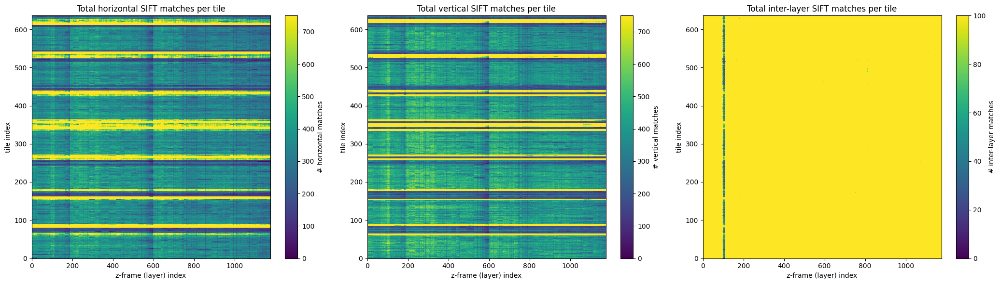

Saved: /nrs/hess/data/sample68_subset_7MFOV_v3/SIFT_matches_per_tile.png


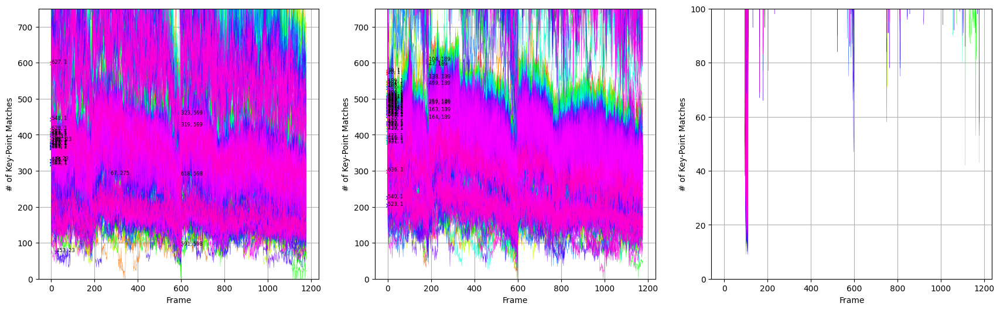

,Layer,Tile,# of key-point matches,Correspondence,File Path
0,24,0,1689,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
1,404,0,356,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
2,405,0,350,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
3,406,0,2336,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
4,407,0,2306,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
...,...,...,...,...,...
4063,405,636,267,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
4064,406,636,2119,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
4065,407,636,2119,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
4066,408,636,307,inter-layer,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...


In [23]:
_, _, outliers_nmatches = test_stack.plot_matches_per_tile(vmax_hr = 750, vmax_vrt = 750, vmax_z = 100,
                            save_res_png = True,
                            dpi = 600)
#res = test_stack.plot_matches_per_tile(logscale=True)
outliers_nmatches

# Set SIFT_nmatches_min = 50, re-deterine SIFT_transformation_valid

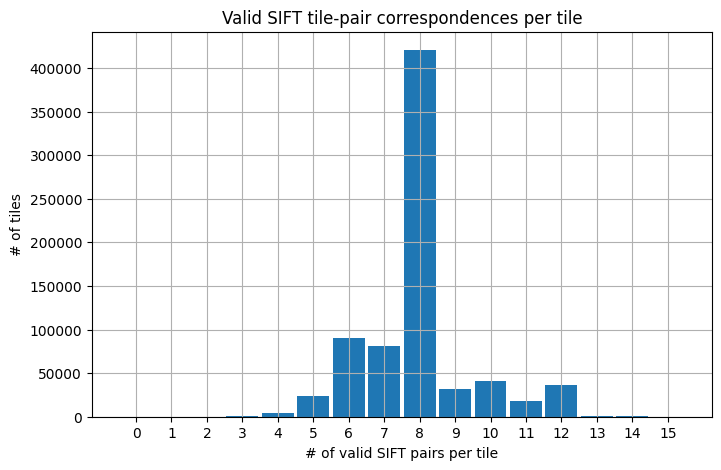

Tiles with NO valid SIFT matches: 19


,Layer,Tile,Incident pairs,File Path
0,594,522,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
1,595,253,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
2,595,522,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
3,595,525,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
4,596,252,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
5,596,253,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
6,596,525,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
7,597,71,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
8,597,252,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
9,597,253,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...


Tiles with exactly ONE valid SIFT match: 38


,Layer,Tile,Incident pairs,File Path
0,591,525,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
1,592,525,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
2,593,525,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
3,594,252,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
4,594,253,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
5,594,525,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
6,595,252,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
7,595,521,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
8,596,71,5,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
9,596,522,6,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...


In [23]:
test_stack.SIFT_nmatches_min = 50
test_stack.SIFT_transformation_valid = test_stack.SIFT_nmatches > test_stack.SIFT_nmatches_min
check_50 = test_stack.histogram_valid_matches_per_tile()

# Determine translations using ECC for index pairs with 5<SIFT_nmatches<50

In [25]:
%%time

ncpus = 2
processes = 1
threads = 1
min_workers = 200
max_workers = 1000
walltime = '23:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    
    ECC_res = test_stack.determine_transformations_ECC(DASK_client=cluster.client,
                                                          ECC_refine_passes = 2,
                                                         ECC_SIFT_nmatches_range = (5, 50))

Cluster dashboard link:  http://10.36.107.39:8787/status
Cluster adapting between 200 and 1000 workers with 2 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/06/30  20:19:05  determine_transformations_ECC:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress


determine_transformations_ECC DASK batches:   0%|          | 0/3 [00:00<?, ?it/s]

/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 97.67 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 97.67 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 

CPU times: user 9min 28s, sys: 1min 2s, total: 10min 31s
Wall time: 17min 21s


# Set SIFT_nmatches_min = 20, re-deterine SIFT_transformation_valid

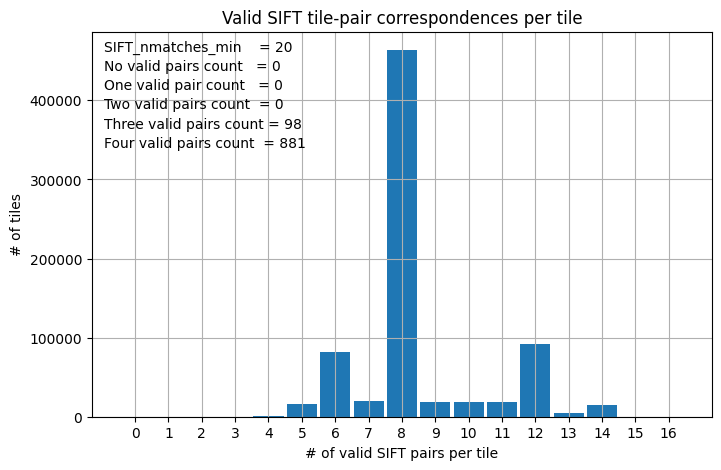

Tiles with NO valid SIFT matches: 0


,Layer,Tile,Incident pairs,File Path


Tiles with exactly ONE valid SIFT match: 0


,Layer,Tile,Incident pairs,File Path


In [7]:
test_stack.SIFT_nmatches_min = 20
test_stack.SIFT_transformation_valid = test_stack.SIFT_nmatches > test_stack.SIFT_nmatches_min
check_20 = test_stack.histogram_valid_matches_per_tile()

# Perform Bundle Transformation Optimization and Intensity Normalization (Global Solve)

2026/07/10  10:19:24   solve_stack_stitching: rebuilt A_csr for intralayer_weight=3, interlayer_weight=100
2026/07/10  10:19:24,  Solving for X displacement using method SIFT
2026/07/10  10:22:20,  Solving for Y displacement using method SIFT
2026/07/10  10:24:13:   solve_stack_stitching (SIFT): updated 749749/749749 tiles; 0 tile(s) with no valid constraints left unchanged.
CPU times: user 4h 47min 53s, sys: 2min 28s, total: 4h 50min 22s
Wall time: 4min 52s


{'outliers': Empty DataFrame
 Columns: [Layer, Tile, mfov, tile_mfov_id, Relative Abs. Shift, File Path]
 Index: [],
 'save_fname': '/nrs/hess/data/sample68_subset_7MFOV_v3/Sample68_7MFOV_Relative_Tile_Shifts_v3c_itra3.0_inter100.0.jpg'}

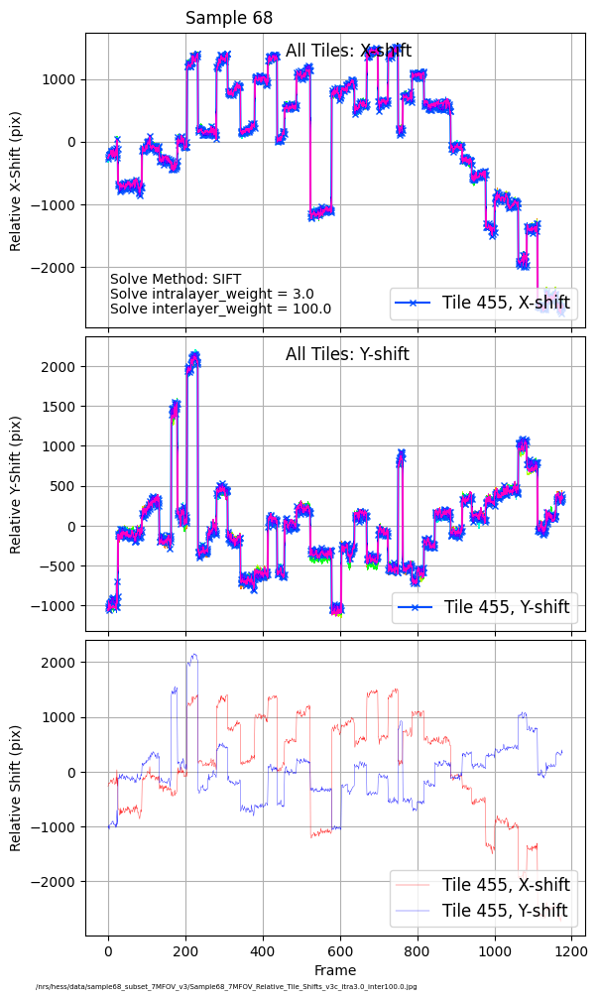

In [8]:
%%time

intralayer_weight = 3.0
interlayer_weight = 100

save_fname  = os.path.join(data_dir, 'Sample68_7MFOV_Relative_Tile_Shifts_v3c_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))


tile_positions_SIFT = test_stack.solve_stack_stitching(method='SIFT',
                                                       intralayer_weight = intralayer_weight,
                                                       interlayer_weight = interlayer_weight,
                                                       subtract_linear_fit=[False, False],
                                                      verbose = True)
test_stack.generate_transformation_report(tile_id=455,
                                         save_fname=save_fname)

2026/07/10  10:26:22   analyze_solve_residuals (SIFT)
2026/07/10  10:26:26   analyze_solve_residuals (SIFT): 3177822 valid pairs, 6677 outliers (intra median 0.747 px, inter median 1.137 px)


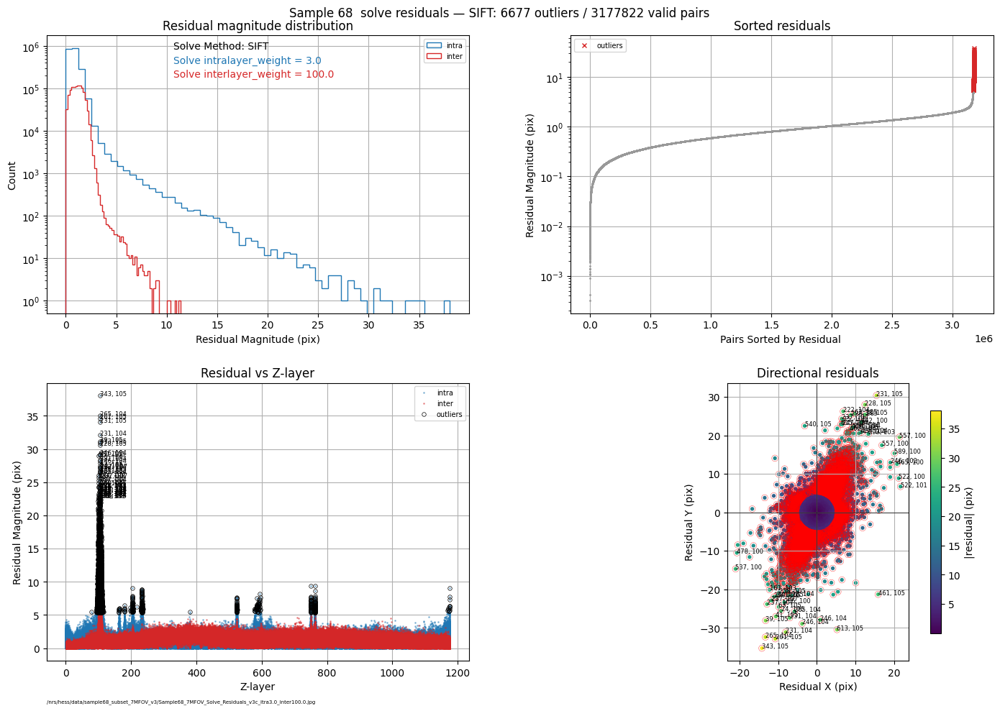

CPU times: user 1min 54s, sys: 1.8 s, total: 1min 56s
Wall time: 1min 56s


In [10]:
%%time

png_name  = os.path.join(data_dir, 'Sample68_7MFOV_Solve_Residuals_v3c_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

rr = test_stack.analyze_solve_residuals(method='SIFT',
                             sigma_thr=10,
                             apply=False,
                                       save_res_png = True,
                                       png_name = png_name)

## Take a note of plot in the upper left panel above.
## The distribution of the residuals for intra-layer pairs has a vary fat tail - meaning that intralayer_weight=3.0 is too low (compared to interlayer_weight = 100.0). This will result in increased tile placement errors, especially in the layers where inter-layer data is weaker - particularly around layers 95-110 with very high milling rate.
## I will later optimize the ratio and find out that optimal intralayer_weight=30.0.  

# Check the current state geometry

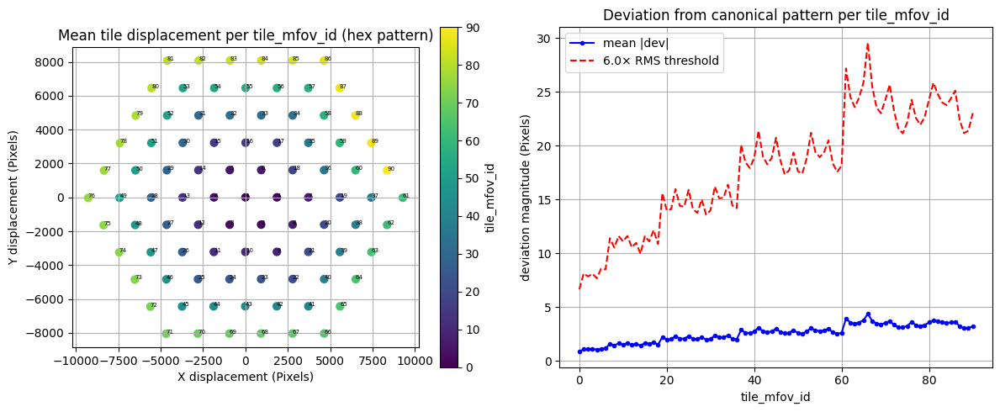

mFOV hex check: 7 mFOV/layer x 1177 layers, 417 outlier tiles (>6.0× RMS)


,Layer,Tile,mfov,tile_mfov_id,deviation,File Path
220,104,246,2,64,42.830093,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
322,105,516,5,61,42.401626,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
68,101,516,5,61,41.308339,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
331,105,545,5,90,41.211313,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
81,101,545,5,90,38.390886,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
...,...,...,...,...,...,...
275,105,182,2,0,7.731598,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
338,106,273,3,0,7.244326,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
272,105,91,1,0,7.110656,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...
415,111,546,6,0,7.082201,/nrs/hess/Hayworth/DATA_Sample68_FULL_FINAL/sc...


In [11]:
check_registered = test_stack.check_mfov_hexagonal_pattern(source='tr_matr')

In [ ]:
replaced = test_stack.replace_tiles_with_canonical_mfov_positions()

# Save the current state

In [12]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3c_itra3_inter100.bin'
dump_f = test_stack.save_parameters(dump_filename = dump_filename)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Dataset Object Data saved into binary dump file:')
print(dump_f)

2026/07/10  10:30:28   Dataset Object Data saved into binary dump file:
/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3c_itra3_inter100.bin
CPU times: user 40.5 s, sys: 4.06 s, total: 44.5 s
Wall time: 45.7 s


# Possible iteration. I did not run any of these cells during this processing run

## Replace default tile coordinates for outliers

In [ ]:
replaced = test_stack.replace_tiles_with_canonical_mfov_positions()

## Recompute FirstPixels based on currect registration

In [ ]:
%%time
new_FirstPixels = test_stack.recalculate_FirstPixels_from_tr_matr()

## Recompute Index Pairs based on updated FirstPixels

In [ ]:
%%time
new_test_stack_geometry = test_stack.compute_index_pairs_and_geometry()

## Re-Run Step 2: Determine Transformations

In [ ]:
%%time

ncpus = 1
processes = 1
threads = 1
min_workers = 1
max_workers = 2000
walltime = '7:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    transformations_results_SIFT = test_stack.determine_transformations_SIFT(DASK_client = cluster.client,
                                                                                SIFT_nmatches_min = 5,
                                                                                use_existing_data = False,
                                                                                verbose = False)

## Display new # of matches per tile

In [ ]:
res = plot_matches_per_tile(test_stack, vmax_hr = 750, vmax_vrt = 500, vmax_z = 50,
                            save_res_png = True,
                            dpi = 600)

## Solve the new state (Bundle Transformation Optimization)

In [ ]:
%%time

tile_positions_SIFT = test_stack.solve_stack_stitching(method='SIFT',
                                                       subtract_linear_fit=[False, False])

test_stack.generate_transformation_report(tile_id=(50))

## Save New State

In [ ]:
%%time

dump_filename = '/nrs/hess/data/sample68_subset/sample68_params_v3_full.bin'
#dump_filename = '//prfs/hesslab/EM_data/jrc_sepia_2510-8/Y2025/M12/jrc_mpi-sepia-2510-08_retrimmed/jrc_mpi-sepia-2510-8_SIFT_params.bin.bin'
dump_f = test_stack.save_parameters(dump_filename = dump_filename)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Dataset Object Data saved into binary dump file:')
print(dump_f)

# Possible method for intensity normalization - mean values of tile intensities (determined using evaluate_FIBSEM_statistics() step)

In [ ]:
%%time
test_stack.compute_frame_intensity_ratios(method='mean')
tile_scales_mean = test_stack.solve_intensity_normalization(method='mean')
print(test_stack.percentile)

# Possible method for intensity normalization - percentile values of tile intensities (determined using evaluate_FIBSEM_statistics() step). If you wantto use a different percentile number - re-run evaluate_FIBSEM_statistics(percentile = new_percentile)

In [ ]:
%%time
test_stack.compute_frame_intensity_ratios(method='percentile')
tile_scales_percentile = test_stack.solve_intensity_normalization(method='percentile')
print(test_stack.percentile)

# Current preferred way of Intensity Normalization - use intensities in overlapping areas, that are determined AFTER coordinate global solve. This path requires running one more DASK step - determining the image inntensities in the newely determined overlap areas.

In [32]:
%%time

bounds, areas = test_stack.compute_solved_pair_overlap_bounds()

ncpus = 1
processes = 1
threads = 1
min_workers = 1
max_workers = 2000
walltime = '7:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    tile_ratios_overlaps_percentile50 = test_stack.compute_overlap_intensity_ratios(DASK_client = cluster.client,
                                                            method='percentile',
                                                            percentile=50,
                                                            min_overlap_pixels=10000)

Cluster dashboard link:  http://10.36.107.26:8787/status
Cluster adapting between 1 and 2000 workers with 1 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/07/02  17:11:49  compute_overlap_intensity_ratios:  DASK client exists. Will perform distributed computations
Use http://h07u16.int.janelia.org:8787/status to monitor DASK progress


compute_overlap_intensity_ratios DASK batches:   0%|          | 0/8 [00:00<?, ?it/s]

/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 115.19 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 115.75 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of siz

CPU times: user 44min 19s, sys: 5min 9s, total: 49min 28s
Wall time: 48min 30s


In [13]:
%%time

intralayer_weight = 3.0
interlayer_weight = 100
tikhonov_damp = 0.0
target_damp = 1.0
anchor_damp = 0.0

tile_scales_overlaps_percentile50_tkh0_trg1 = test_stack.solve_intensity_normalization(method='overlap_percentile',
                                                                             intralayer_weight = intralayer_weight,
                                                                            interlayer_weight = interlayer_weight,
                                                                            tikhonov_damp = tikhonov_damp,
                                                                            target_damp = target_damp,
                                                                            anchor_damp = anchor_damp,
                                                                            verbose = True)
print(test_stack.percentile)

2026/07/10  10:32:30   solve_intensity_normalization: rebuilt A_csr for intralayer_weight=3, interlayer_weight=100
Detector prior: stacking 3215430 target rows (target_damp=1)
Intensity normalization method: overlap_percentile
Intensity normalization parameters (tikhonov_damp=0, target_damp=1, anchor_damp=0): intralayer_weight=3.0000, interlayer_weight=100.0000
Intensity scale factors: min=0.4905, max=2.8041, std=0.1443
50
CPU times: user 4h 35min 28s, sys: 3min 29s, total: 4h 38min 57s
Wall time: 6min 27s


In [43]:
%%time

layer_id = 150
snapshot_fname = os.path.join(data_dir, 'layer{:d}_registered_intensity_normalized_snapshot.png'.format(layer_id))
dat_fname = snapshot_fname.replace('_snapshot.png', '.dat')
image_fname = snapshot_fname.replace('_snapshot.png', '_v3c_dperc.jpg')

with Client() as client:
    layer_mosaic_overlap_percentile50_tkh3_trg3, layer_id = test_stack.assemble_layer_mosaic(layer_id,
                                            DASK_client =client,
                                            thr_min=0.41,
                                            overlay_tile_grid = False,
                                            add_tile_ids = True,
                                            tile_id_fontsize = 6,
                                            verbose = False,
                                            perform_intensity_normalization=True,
                                            save_snapshot = False,                                                 
                                            snapshot_fname = snapshot_fname,
                                            save_to_dat = False,
                                            dat_fname = dat_fname,
                                            save_images = True,
                                            image_fname = image_fname,
                                            dpi = 600)

2026/07/02  18:13:59  assemble_layer_mosaic:  DASK client exists. Will perform distributed computations
Use http://h07u16.int.janelia.org:8787/status to monitor DASK progress


Assembling RawImageA mosaic layer:   0%|          | 0/637 [00:00<?, ?it/s]

Detector:, data range: vmin=53.25, vmax=79.30
CPU times: user 3min 14s, sys: 3min 41s, total: 6min 55s
Wall time: 6min 56s


# Generate Intensity Report and Recalculate Tile scales

2026/07/10  10:38:58   Using fit_params:  SG 101 3
Generating Plot
CPU times: user 6.88 s, sys: 97.7 ms, total: 6.98 s
Wall time: 4.13 s


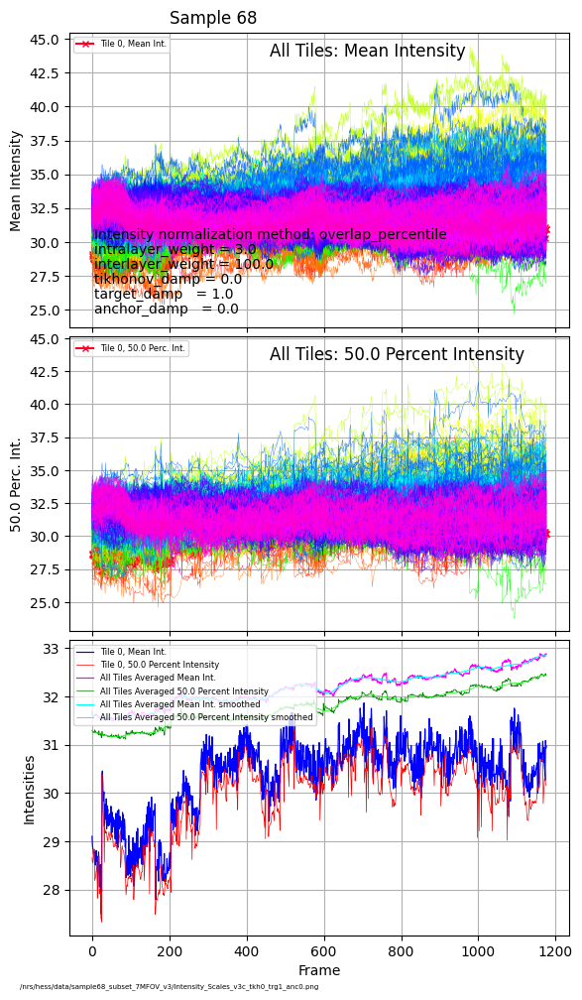

In [14]:
%%time

fit_params = ['SG', 101, 3]
tile_scale_update_source = 'aims'
save_fname = os.path.join(data_dir, 'Intensity_Scales_v3c_tkh0_trg1_anc0.png')

int_res = test_stack.generate_intensity_report(fit_params = fit_params,
                                    tile_scale_update_source = tile_scale_update_source,
                                     save_fname = save_fname,
                                     save_png = True,
                                    verbose = True)

## Take a note at the plots above. The (already scaled) intensity plots are diverging, and some edge diverging significantly. This is because the edge tiles are poorely anchored.
## It turns out that optimal Intensity Solve in this case is acheived with these parameters: tikhonov_damp = 0.0, target_damp = 0.0, anchor_damp = 10.0

# Save Current results into a Binary Dump File

In [15]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3c_itra3_inter100.bin'
dump_f = test_stack.save_parameters(dump_filename = dump_filename)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Dataset Object Data saved into binary dump file:')
print(dump_f)

2026/07/10  10:40:26   Dataset Object Data saved into binary dump file:
/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3c_itra3_inter100.bin
CPU times: user 40.6 s, sys: 4.4 s, total: 45 s
Wall time: 47 s


In [6]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3c_itra3_inter100.bin'

fnm_mosaic_stack = os.path.join(data_dir, 'sample68_layer.mrc')

test_stack = FIBSEM_mosaic_dataset(fls_stack,
                                   recall_parameters = True,
                                    dump_filename = dump_filename,
                                    data_dir = data_dir,
                                    deformation_field = DF,
                                    fnm_mosaic_stack = fnm_mosaic_stack,
                                    verbose = True,
                                    memory_profiling = True,
                                    max_futures = 100000)

test_stack.TPM = 91
test_stack.Sample_ID = 'Sample 68'

2026/07/10  10:18:48   Loading saved parameters from dump: /nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3c_itra3_inter100.bin


Recalling the data set parameters:   0%|          | 0/121 [00:00<?, ?it/s]

2026/07/10  10:18:48   Recalled FIBSEM_mosaic_dataset instance from dump (skipped full init).
2026/07/10  10:18:48   Initialized FIBSEM_mosaic_dataset instance:
Total number of tile files: 749749
Number of tiles per Z-layer: 637
Number of Z-slices (nz_tiles): 1177

Total number of left-right intra-layer pairs:  762696
Total number of up-down intra-layer pairs:  1370028
Total number of intra-layer pairs:  2132724
Total number of inter-layer pairs:  1082706
Total number of pairwise transformations : 3215430
CPU times: user 9.95 s, sys: 2.88 s, total: 12.8 s
Wall time: 14.8 s


# Assemble registered layer mosaic with intensity normalization

In [40]:
%%time

layer_id = 150
snapshot_fname = os.path.join(data_dir, 'layer{:d}_registered_intensity_normalized_snapshot.png'.format(layer_id))
dat_fname = snapshot_fname.replace('_snapshot.png', '.dat')
image_fname = snapshot_fname.replace('_snapshot.png', '_v3c_dpercentiles.jpg')

with Client() as client:
    layer_mosaic_overlap_percentile50_tkh3_trg3, layer_id = test_stack.assemble_layer_mosaic(layer_id,
                                            DASK_client =client,
                                            thr_min=0.41,
                                            overlay_tile_grid = True,
                                            add_tile_ids = True,
                                            tile_id_fontsize = 6,
                                            verbose = False,
                                            perform_intensity_normalization=True,
                                            save_snapshot = False,                                                 
                                            snapshot_fname = snapshot_fname,
                                            save_to_dat = False,
                                            dat_fname = dat_fname,
                                            save_images = True,
                                            image_fname = image_fname,
                                            dpi = 600)

2026/07/01  09:33:16  assemble_layer_mosaic:  DASK client exists. Will perform distributed computations
Use http://h07u29.int.janelia.org:8787/status to monitor DASK progress


Assembling RawImageA mosaic layer:   0%|          | 0/637 [00:00<?, ?it/s]

Detector:, data range: vmin=51.68, vmax=81.54
CPU times: user 3min 19s, sys: 5min 39s, total: 8min 59s
Wall time: 8min 58s


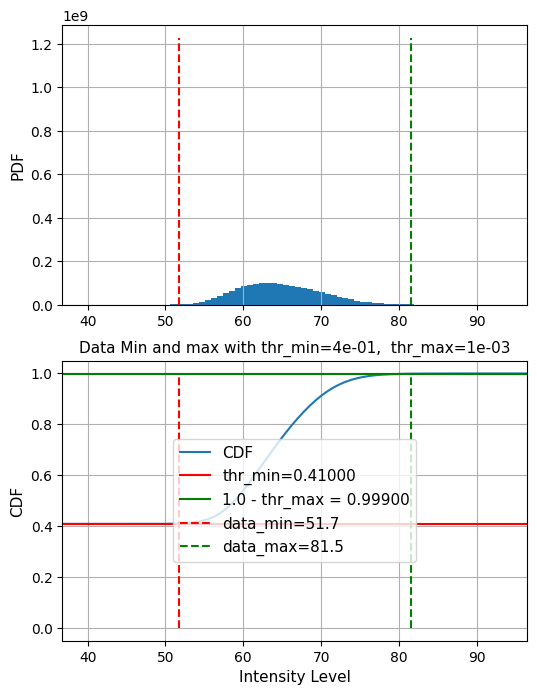

In [41]:
vmin, vmax = get_min_max_thresholds(layer_mosaic_overlap_percentile50_tkh3_trg3[0], thr_min=0.41, disp_res=True)

# Remove Intermediate Binary Files containing KeyPoints, Descriptors, and Matches

In [ ]:
%%time

fls_bin1 = np.array(test_stack.fnms_kpts).ravel()
print('Starting removing inermediate {:d} BIN files containing Key-Points'.format(len(fls_bin1)))
with Client() as client:
    dask_check_res = check_DASK(client, prefix = 'Removing BIN files containing Key-Points')
    futures = client.map(dask_remove_file, fls_bin1)
    dask_results = client.gather(futures)
print('Finished removing inermediate BIN files containing Key-Points')
print('Removed all intermediate BIN files containing Key-Points successfully:  ', np.all(fls_bin1==dask_results))
print('')

fls_bin2 = np.array(test_stack.SIFT_fnms_matches).ravel()
print('Starting removing inermediate {:d} BIN files containing Key-Point Matches'.format(len(fls_bin2)))
with Client() as client:
    dask_check_res = check_DASK(client, prefix = 'Removing BIN files containing Key-Point Matches')
    futures = client.map(dask_remove_file, fls_bin2)
    dask_results = client.gather(futures)
print('Finished removing inermediate BIN files containing Key-Point Matches')
print('Removed all intermediate BIN files containing Key-Point Matches successfully:  ', np.all(fls_bin2==dask_results))

# Save the data into ZARR3 file (single-step save)

In [16]:
%%time

dst_path  = '/nrs/hess/data_external/MSEM/sample68_subset_7MFOV_v3c_SIFT20_perc50_intra3_inter100_tkh0_trg0.zarr'

ncpus = 2
processes = 1
threads = 1
min_workers = 200
max_workers = 1000
walltime = '23:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    result = test_stack.save_stack_zarr3(
        DASK_client=cluster.client,
        output_zarr_path  = dst_path,
        zarr_dataset_name = 'sample68_subset_7MFOV_v3c_SIFT20C_perc50_intra3_inter100_tkh0_trg0',
        dtp = np.uint8,
        fill_value = 0,
        U8_range = [40.0, 90.0],
        perform_intensity_normalization = True,
        n_pyramid_levels  = 6,
        voxel_size_zyx = (24.0, 8.0, 8.0),
        chunk_size        = (32, 256, 256),
        shard_size        = (32, 256, 256),
        axis_order        = 'zyx',       # source is zyx, z outermost → xy-slice chunks contiguous for coalescing
        #transpose_codec   = True,        # F-order bytes inside inner chunks
        compression       = 'zstd',
        neuroglancer_serve_base_url = "https://s3.janelia.org/hess-lab/MSEM",
        compression_level = 3,
        verbose=True,
    )

Cluster dashboard link:  http://10.36.107.22:8787/status
Cluster adapting between 200 and 1000 workers with 2 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/07/01  22:24:50  save_stack_zarr3:  DASK client exists. Will perform distributed computations
Use http://h07u12.int.janelia.org:8787/status to monitor DASK progress
The output stack (axis_order='zyx') will have voxel size: (24.0, 8.0, 8.0)
  Pre-allocated s0  shape=(1177, 53653, 55922)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s1  shape=(588, 26826, 27961)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s2  shape=(294, 13413, 13980)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s3  shape=(147, 6706, 6990)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s4  shape=(73, 3353, 3495)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s5  shape=(36, 1676, 1747)  chunks=(32, 256, 256)  shards=(32, 256, 256)

2026/07/01 

Writing s0 (DASK batches):   0%|          | 0/18 [00:00<?, ?it/s]

2026/07/01  22:25:05   Submitting s0 batch 1: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 78.63 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 1):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/01  22:52:48   Submitting s0 batch 2: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 79.49 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 2):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/01  23:21:18   Submitting s0 batch 3: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 79.37 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 3):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/01  23:46:17   Submitting s0 batch 4: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 80.75 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 4):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  00:12:36   Submitting s0 batch 5: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.34 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 5):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  00:36:59   Submitting s0 batch 6: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 81.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 6):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  01:02:09   Submitting s0 batch 7: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 81.99 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 7):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  01:26:01   Submitting s0 batch 8: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.79 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 8):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  01:51:11   Submitting s0 batch 9: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.66 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 9):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  02:15:33   Submitting s0 batch 10: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.72 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 10):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  02:39:44   Submitting s0 batch 11: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.06 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 11):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  03:05:36   Submitting s0 batch 12: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 81.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 12):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  03:27:46   Submitting s0 batch 13: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.22 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 13):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  03:50:02   Submitting s0 batch 14: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.71 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 14):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  04:18:46   Submitting s0 batch 15: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 15):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  04:52:11   Submitting s0 batch 16: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.70 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 16):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  05:23:17   Submitting s0 batch 17: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 75.13 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 17):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  06:05:24   Submitting s0 batch 18: 1630 shards


  s0 shards (batch 18):   0%|          | 0/1630 [00:00<?, ?it/s]


2026/07/02  06:05:33   Building s1:  219450 shards from s0


Downsampling to s1 (DASK batches):   0%|          | 0/3 [00:00<?, ?it/s]

2026/07/02  06:05:33   Submitting s1 batch 1/3: shards [0, 100000)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 15.11 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s1 shards (batch 1/3):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  06:10:44   Submitting s1 batch 2/3: shards [100000, 200000)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 15.35 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s1 shards (batch 2/3):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/02  06:16:15   Submitting s1 batch 3/3: shards [200000, 219450)


  s1 shards (batch 3/3):   0%|          | 0/19450 [00:00<?, ?it/s]


2026/07/02  06:17:15   Building s2:  29150 shards from s1


Downsampling to s2 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/02  06:17:15   Submitting s2 batch 1/1: shards [0, 29150)


  s2 shards (batch 1/1):   0%|          | 0/29150 [00:00<?, ?it/s]


2026/07/02  06:18:55   Building s3:  3780 shards from s2


Downsampling to s3 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/02  06:18:55   Submitting s3 batch 1/1: shards [0, 3780)


  s3 shards (batch 1/1):   0%|          | 0/3780 [00:00<?, ?it/s]


2026/07/02  06:19:08   Building s4:  588 shards from s3


Downsampling to s4 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/02  06:19:08   Submitting s4 batch 1/1: shards [0, 588)


  s4 shards (batch 1/1):   0%|          | 0/588 [00:00<?, ?it/s]


2026/07/02  06:19:10   Building s5:  98 shards from s4


Downsampling to s5 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/02  06:19:10   Submitting s5 batch 1/1: shards [0, 98)


  s5 shards (batch 1/1):   0%|          | 0/98 [00:00<?, ?it/s]


2026/07/02  06:19:10   save_stack_zarr3 done in 474.3 min

Neuroglancer — how to view (zarr v3)
  Serve:  python -m http.server 9000 --directory /nrs/hess/data_external/MSEM
  Source: https://s3.janelia.org/hess-lab/MSEM/sample68_subset_7MFOV_v3c_SIFT20_perc50_intra3_inter100_tkh0_trg0.zarr/|zarr3:

  Link:   https://neuroglancer-demo.appspot.com/#!%7B%22layers%22%3A%20%5B%7B%22type%22%3A%20%22image%22%2C%20%22source%22%3A%20%22https%3A//s3.janelia.org/hess-lab/MSEM/sample68_subset_7MFOV_v3c_SIFT20_perc50_intra3_inter100_tkh0_trg0.zarr/%7Czarr3%3A%22%2C%20%22tab%22%3A%20%22source%22%2C%20%22name%22%3A%20%22sample68_subset_7MFOV_v3c_SIFT20C_perc50_intra3_inter100_tkh0_trg0%22%7D%5D%2C%20%22selectedLayer%22%3A%20%7B%22visible%22%3A%20true%2C%20%22layer%22%3A%20%22sample68_subset_7MFOV_v3c_SIFT20C_perc50_intra3_inter100_tkh0_trg0%22%7D%2C%20%22layout%22%3A%20%224panel-alt%22%2C%20%22displayDimensions%22%3A%20%5B%22z%22%2C%20%22y%22%2C%20%22x%22%5D%7D


Exception in callback multi_future.<locals>.callback(<Task cancell...ession.py:77>>) at /groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/gen.py:540
handle: <Handle multi_future.<locals>.callback(<Task cancell...ession.py:77>>) at /groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/gen.py:540>
Traceback (most recent call last):
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/tornado/gen.py", line 546, in callback
    result_list.append(f.result())
                       ^^^^^^^^^^
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/bokeh/server/session.py", line 106, in _needs_document_lock_wrapper
    await p
  File "/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/bokeh/server/views/ws.py", line 284, in send_message
    awa

CPU times: user 2h 37min 33s, sys: 16min 35s, total: 2h 54min 8s
Wall time: 7h 54min 21s


# Post- / Re- Processing

In [4]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3d.bin'

fnm_mosaic_stack = os.path.join(data_dir, 'sample68_layer.mrc')

test_stack = FIBSEM_mosaic_dataset(fls_stack,
                                   recall_parameters = True,
                                    dump_filename = dump_filename,
                                    data_dir = data_dir,
                                    deformation_field = DF,
                                    fnm_mosaic_stack = fnm_mosaic_stack,
                                    SIFT_contrastThreshold = 0.005,
                                    Lowe_Ratio_Threshold = 0.70,
                                    RANSAC_initial_fraction = 0.05,
                                    max_iter = 100000,
                                    drmax = 3.0,
                                    percentile = 50,
                                    verbose = True,
                                    memory_profiling = True,
                                    max_futures = 100000)

test_stack.TPM = 91
test_stack.Sample_ID = 'Sample 68'

print('Set min_intralayer_overlap_pixels = ', test_stack.min_intralayer_overlap_pixels)
print('Set min_interlayer_overlap_pixels = ', test_stack.min_interlayer_overlap_pixels)

2026/07/08  16:53:25   Loading saved parameters from dump: /nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3d.bin


Recalling the data set parameters:   0%|          | 0/121 [00:00<?, ?it/s]

2026/07/08  16:53:25   Recalled FIBSEM_mosaic_dataset instance from dump (skipped full init).
2026/07/08  16:53:25   Initialized FIBSEM_mosaic_dataset instance:
Total number of tile files: 749749
Number of tiles per Z-layer: 637
Number of Z-slices (nz_tiles): 1177

Total number of left-right intra-layer pairs:  762696
Total number of up-down intra-layer pairs:  1370028
Total number of intra-layer pairs:  2132724
Total number of inter-layer pairs:  1082706
Total number of pairwise transformations : 3215430
Set min_intralayer_overlap_pixels =  69920.0
Set min_interlayer_overlap_pixels =  699200.0
CPU times: user 8.61 s, sys: 2.88 s, total: 11.5 s
Wall time: 11.5 s


In [5]:
test_stack.SIFT_nmatches_min

20

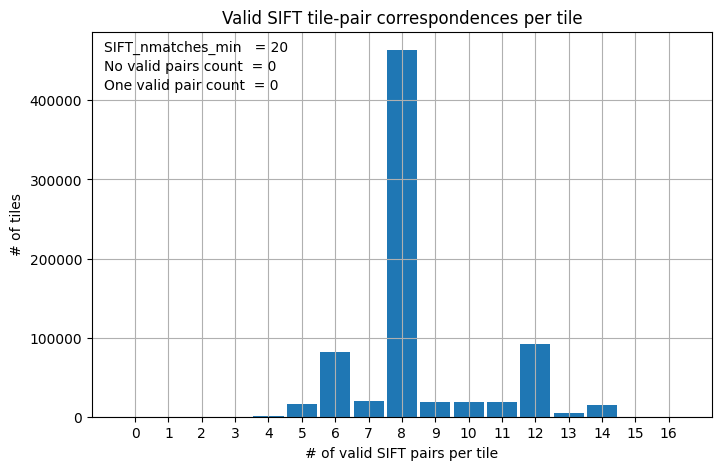

Tiles with NO valid SIFT matches: 0


,Layer,Tile,Incident pairs,File Path


Tiles with exactly ONE valid SIFT match: 0


,Layer,Tile,Incident pairs,File Path


In [6]:
check_20 = test_stack.histogram_valid_matches_per_tile()

2026/07/08  16:53:39   solve_stack_stitching: rebuilt A_csr for intralayer_weight=3, interlayer_weight=100
2026/07/08  16:53:39,  Solving for X displacement using method SIFT
2026/07/08  16:56:41,  Solving for Y displacement using method SIFT
2026/07/08  16:58:32:   solve_stack_stitching (SIFT): updated 749749/749749 tiles; 0 tile(s) with no valid constraints left unchanged.
CPU times: user 4h 48min 54s, sys: 2min 34s, total: 4h 51min 29s
Wall time: 4min 56s


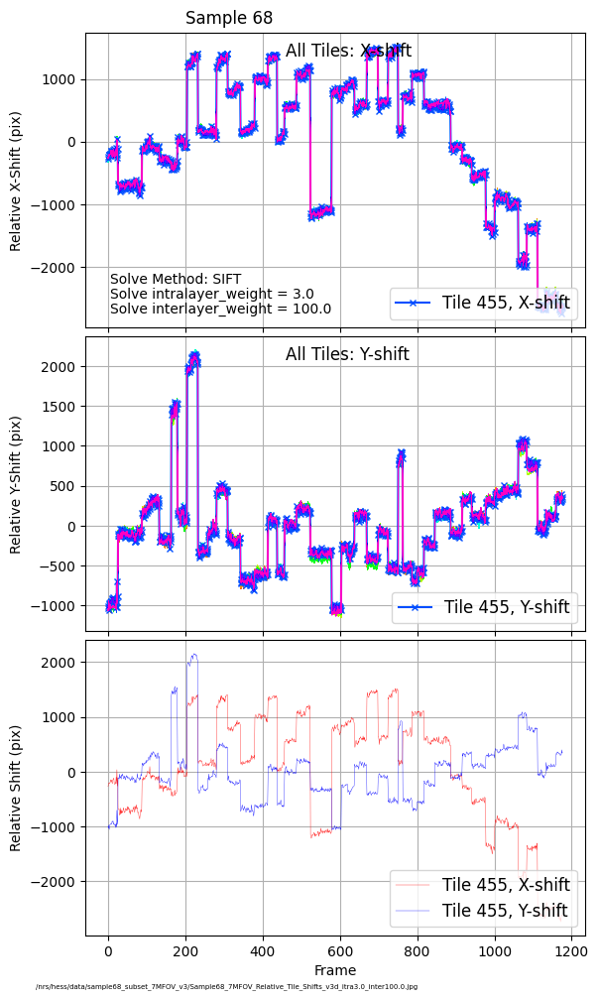

In [7]:
%%time

intralayer_weight = 3.0
interlayer_weight = 100

tile_positions_SIFT_3e = test_stack.solve_stack_stitching(method='SIFT',
                                                       intralayer_weight = intralayer_weight,
                                                       interlayer_weight = interlayer_weight,
                                                       subtract_linear_fit=[False, False],
                                                      verbose = True)

save_fname  = os.path.join(data_dir, 'Sample68_7MFOV_Relative_Tile_Shifts_v3d_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

report = test_stack.generate_transformation_report(tile_id=455,
                                         save_fname=save_fname)

2026/07/08  16:58:39   analyze_solve_residuals (SIFT)
2026/07/08  16:58:44   analyze_solve_residuals (SIFT): 3177822 valid pairs, 433 outliers (intra median 0.747 px, inter median 1.137 px)


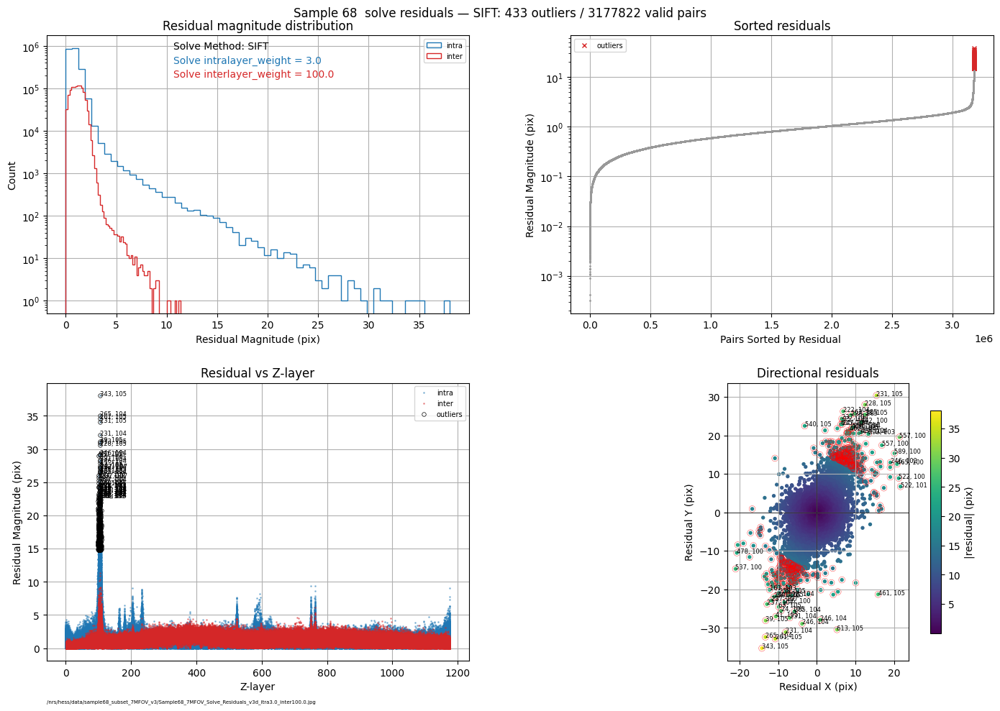

CPU times: user 1min 55s, sys: 1.97 s, total: 1min 57s
Wall time: 1min 57s


In [8]:
%%time

png_name  = os.path.join(data_dir, 'Sample68_7MFOV_Solve_Residuals_v3d_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

rr = test_stack.analyze_solve_residuals(method='SIFT',
                                        sigma_thr=30,
                                        apply=False,
                                        save_res_png = True,
                                        png_name = png_name)

In [9]:
rx = test_stack.find_tile_pairs(105, 263)

,Pair Index,Layer 0,Tile 0,Layer 1,Tile 1,SIFT x-shift,SIFT y-shift,SIFT nmatches,SIFT valid,ECC x-shift,ECC y-shift,ECC valid,overlap_areas
0,68287,105,61,105,263,-1323.372374,-916.910290,483,True,0.000000,0.000000,False,555022
1,68288,105,344,105,263,-1047.843066,286.819258,1181,True,0.000000,0.000000,False,1397027
2,68289,105,263,105,264,-1850.811161,-4.473519,199,True,0.000000,0.000000,False,257884
3,68377,105,263,105,343,-818.684014,-291.873735,1367,True,0.000000,0.000000,False,1706696
4,885386,105,235,105,263,920.740262,-1618.972865,118,True,0.000000,0.000000,False,144572
5,885387,105,262,105,263,-932.466716,-1622.883610,103,True,0.000000,0.000000,False,139379
6,2227927,104,61,105,263,0.000000,0.000000,0,False,0.000000,0.000000,False,518185
7,2228205,104,263,105,263,-22.197121,61.974307,11,False,-22.738464,63.704292,True,3378473
8,2228326,104,343,105,263,810.176280,292.470624,5,False,849.506592,173.756790,True,1792667
9,2228331,104,344,105,263,-1056.078416,287.745550,6,False,-1023.471619,172.647888,True,1389294


In [10]:
%%time

print(test_stack.percentile)

intralayer_weight = 3.0
interlayer_weight = 100
tikhonov_damp = 0.0
target_damp = 0.0
anchor_damp = 3.0

tile_scales_overlaps_percentile50_tkh0_trg1 = test_stack.solve_intensity_normalization(method='overlap_percentile',
                                                                             intralayer_weight = intralayer_weight,
                                                                            interlayer_weight = interlayer_weight,
                                                                            tikhonov_damp = tikhonov_damp,
                                                                            target_damp = target_damp,
                                                                            anchor_damp = anchor_damp,          
                                                                            verbose = True)

50
2026/07/08  17:02:02   solve_intensity_normalization: rebuilt A_csr for intralayer_weight=3, interlayer_weight=100
Per-tile anchor: stacking 749749 anchor rows (anchor_damp=3, source=frame_percentile, degree_weighted=True)
Intensity normalization method: overlap_percentile
Intensity normalization parameters (tikhonov_damp=0, target_damp=0, anchor_damp=3): intralayer_weight=3.0000, interlayer_weight=100.0000
Intensity scale factors: min=0.4853, max=2.8410, std=0.1378
CPU times: user 27min 26s, sys: 16.4 s, total: 27min 42s
Wall time: 30.1 s


2026/07/08  17:02:32   Using fit_params:  SG 101 3
Generating Plot
CPU times: user 9.03 s, sys: 93 ms, total: 9.12 s
Wall time: 4.6 s


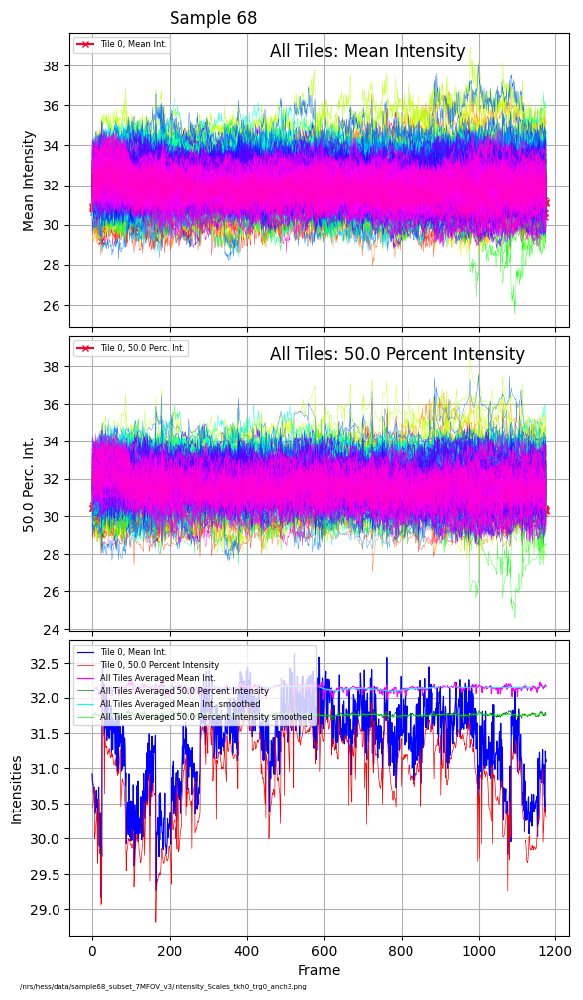

In [11]:
%%time

fit_params = ['SG', 101, 3]
tile_scale_update_source = 'aims'
save_fname = os.path.join(data_dir, 'Intensity_Scales_tkh0_trg0_anch3.png')

int_res = test_stack.generate_intensity_report(fit_params = fit_params,
                                    tile_scale_update_source = tile_scale_update_source,
                                     save_fname = save_fname,
                                     save_png = True,
                                    verbose = True)

2026/07/08  17:02:40   solve_stack_stitching: rebuilt A_csr for intralayer_weight=10, interlayer_weight=100
2026/07/08  17:02:40,  Solving for X displacement using method SIFT
2026/07/08  17:05:26,  Solving for Y displacement using method SIFT
2026/07/08  17:07:12:   solve_stack_stitching (SIFT): updated 749749/749749 tiles; 0 tile(s) with no valid constraints left unchanged.
CPU times: user 4h 32min 43s, sys: 2min 19s, total: 4h 35min 2s
Wall time: 4min 35s


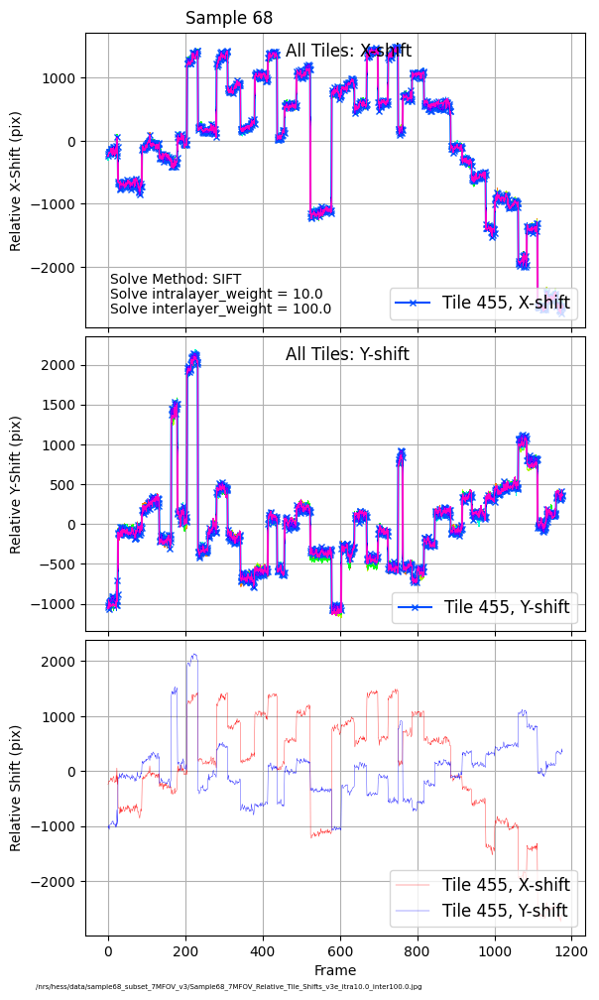

In [12]:
%%time

intralayer_weight = 10.0
interlayer_weight = 100.0

tile_positions_SIFT_3e = test_stack.solve_stack_stitching(method='SIFT',
                                                       intralayer_weight = intralayer_weight,
                                                       interlayer_weight = interlayer_weight,
                                                       subtract_linear_fit=[False, False],
                                                      verbose = True)

save_fname  = os.path.join(data_dir, 'Sample68_7MFOV_Relative_Tile_Shifts_v3e_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

report = test_stack.generate_transformation_report(tile_id=455,
                                         save_fname=save_fname)

2026/07/08  17:07:19   analyze_solve_residuals (SIFT)
2026/07/08  17:07:24   analyze_solve_residuals (SIFT): 3177822 valid pairs, 110 outliers (intra median 0.539 px, inter median 1.101 px)


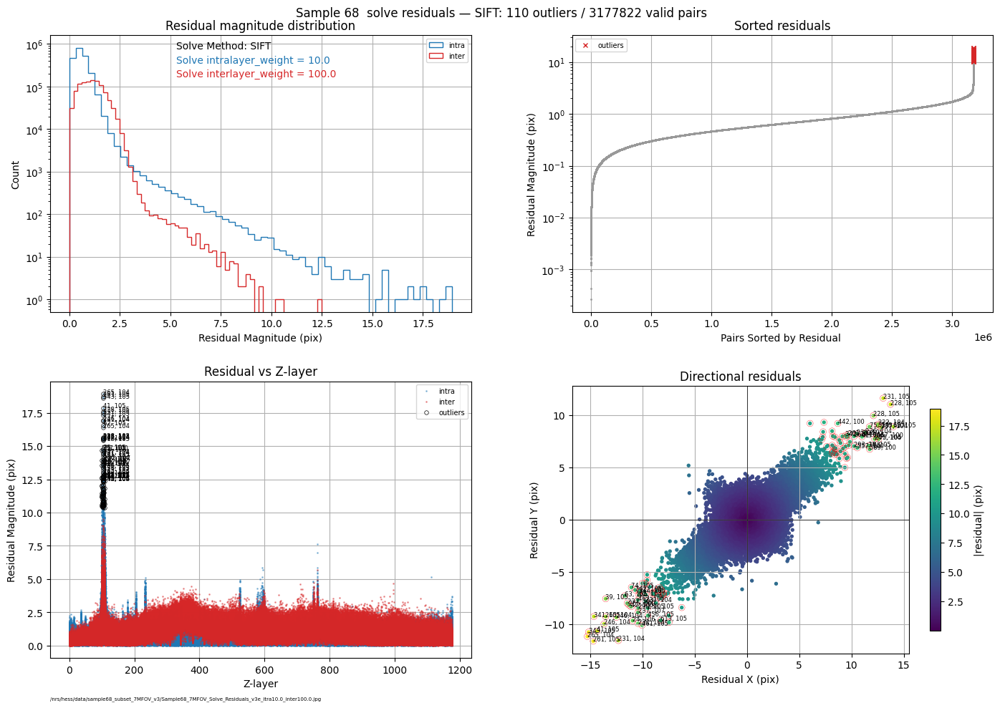

CPU times: user 1min 54s, sys: 2.52 s, total: 1min 56s
Wall time: 1min 57s


In [13]:
%%time

png_name  = os.path.join(data_dir, 'Sample68_7MFOV_Solve_Residuals_v3e_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

rr = test_stack.analyze_solve_residuals(method='SIFT',
                                        sigma_thr=30,
                                        apply=False,
                                        save_res_png = True,
                                        png_name = png_name)

2026/07/08  17:09:16   solve_stack_stitching: rebuilt A_csr for intralayer_weight=30, interlayer_weight=100
2026/07/08  17:09:16,  Solving for X displacement using method SIFT
2026/07/08  17:12:03,  Solving for Y displacement using method SIFT
2026/07/08  17:13:52:   solve_stack_stitching (SIFT): updated 749749/749749 tiles; 0 tile(s) with no valid constraints left unchanged.
CPU times: user 4h 37min 45s, sys: 2min 21s, total: 4h 40min 7s
Wall time: 4min 39s


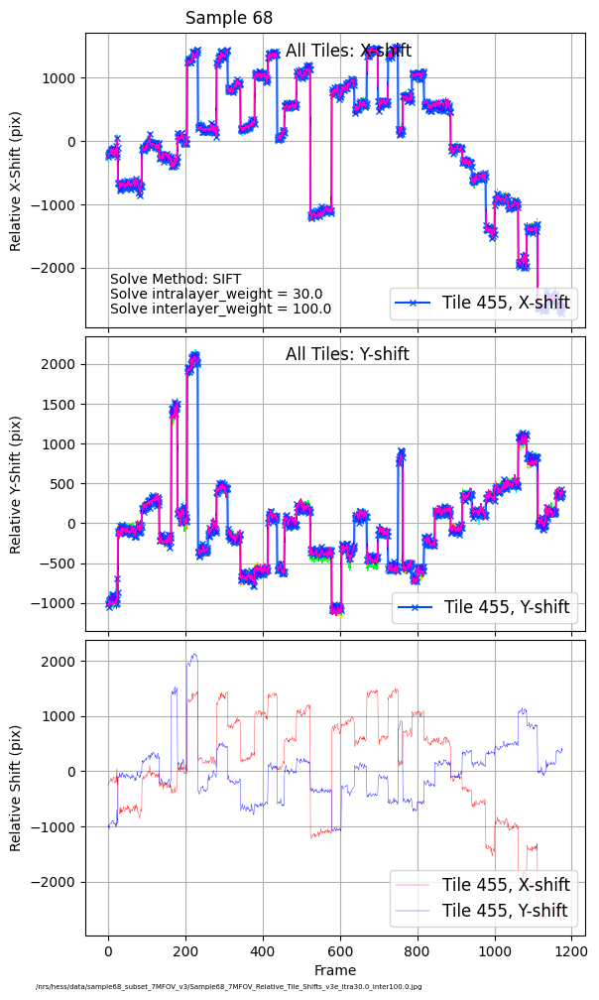

In [14]:
%%time

intralayer_weight = 30.0
interlayer_weight = 100.0

tile_positions_SIFT_3e = test_stack.solve_stack_stitching(method='SIFT',
                                                       intralayer_weight = intralayer_weight,
                                                       interlayer_weight = interlayer_weight,
                                                       subtract_linear_fit=[False, False],
                                                      verbose = True)

save_fname  = os.path.join(data_dir, 'Sample68_7MFOV_Relative_Tile_Shifts_v3e_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

report = test_stack.generate_transformation_report(tile_id=455,
                                         save_fname=save_fname)

2026/07/08  17:13:59   analyze_solve_residuals (SIFT)
2026/07/08  17:14:06   analyze_solve_residuals (SIFT): 3177822 valid pairs, 39 outliers (intra median 0.423 px, inter median 1.116 px)


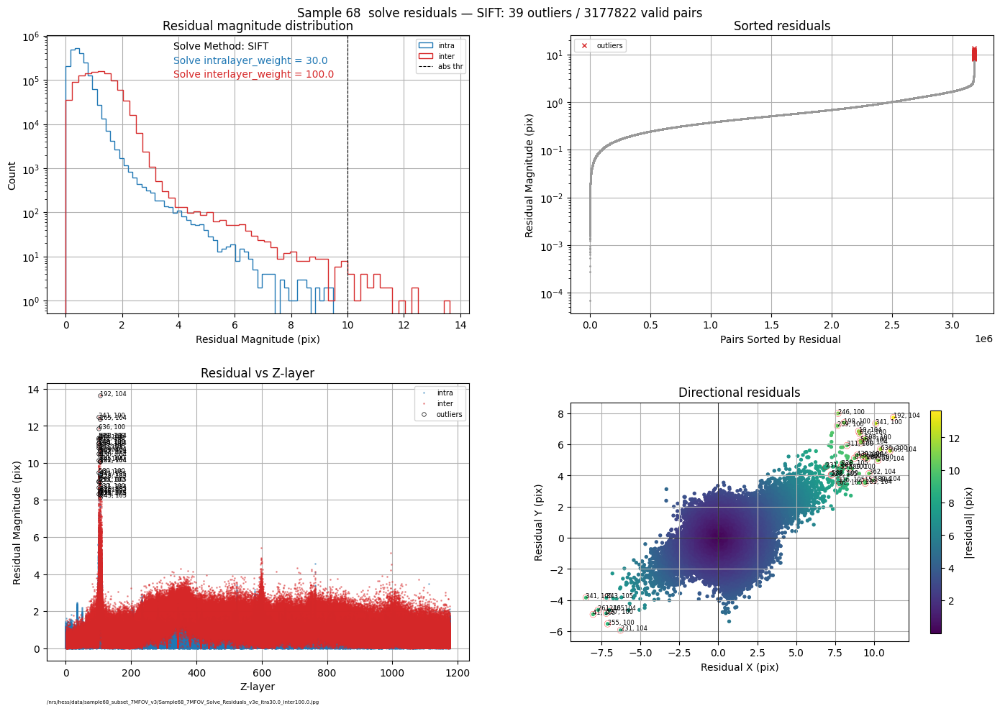

CPU times: user 1min 55s, sys: 6.49 s, total: 2min 2s
Wall time: 2min 2s


In [15]:
%%time

png_name  = os.path.join(data_dir, 'Sample68_7MFOV_Solve_Residuals_v3e_itra{:.1f}_inter{:.1f}.jpg'.format(intralayer_weight, interlayer_weight))

rr = test_stack.analyze_solve_residuals(method='SIFT',
                                        sigma_thr=30,
                                        resid_thr_pixels = 10,
                                        apply=False,
                                        save_res_png = True,
                                        png_name = png_name)

In [16]:
%%time

bounds, areas = test_stack.compute_solved_pair_overlap_bounds()

ncpus = 1
processes = 1
threads = 1
min_workers = 1
max_workers = 2000
walltime = '7:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    tile_ratios_overlaps_v3e = test_stack.compute_overlap_intensity_ratios(DASK_client = cluster.client,
                                                            method='percentile',
                                                            percentile=50,
                                                            min_overlap_pixels=10000)

Cluster dashboard link:  http://10.36.107.36:8787/status
Cluster adapting between 1 and 2000 workers with 1 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/07/08  17:16:03  compute_overlap_intensity_ratios:  DASK client exists. Will perform distributed computations
Use http://h07u26.int.janelia.org:8787/status to monitor DASK progress


compute_overlap_intensity_ratios DASK batches:   0%|          | 0/8 [00:00<?, ?it/s]

/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 115.19 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 115.75 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of siz

CPU times: user 46min 31s, sys: 3min 37s, total: 50min 9s
Wall time: 50min 50s


In [17]:
%%time

print(test_stack.percentile)

intralayer_weight = 30.0
interlayer_weight = 100.0
tikhonov_damp = 0.0
target_damp = 0.0
anchor_damp = 3.0

tile_scales_overlaps = test_stack.solve_intensity_normalization(method='overlap_percentile',
                                                                    intralayer_weight = intralayer_weight,
                                                                    interlayer_weight = interlayer_weight,
                                                                    tikhonov_damp = tikhonov_damp,
                                                                    target_damp = target_damp,
                                                                    anchor_damp = anchor_damp,          
                                                                    verbose = True)

50
2026/07/08  18:06:52   solve_intensity_normalization: rebuilt A_csr for intralayer_weight=30, interlayer_weight=100
Per-tile anchor: stacking 749749 anchor rows (anchor_damp=3, source=frame_percentile, degree_weighted=True)
Intensity normalization method: overlap_percentile
Intensity normalization parameters (tikhonov_damp=0, target_damp=0, anchor_damp=3): intralayer_weight=30.0000, interlayer_weight=100.0000
Intensity scale factors: min=0.4985, max=2.8306, std=0.1436
CPU times: user 16min 50s, sys: 70.9 ms, total: 16min 51s
Wall time: 16.4 s


2026/07/08  18:07:08   Using fit_params:  SG 101 3
Generating Plot
CPU times: user 8.07 s, sys: 86.7 ms, total: 8.16 s
Wall time: 4.12 s


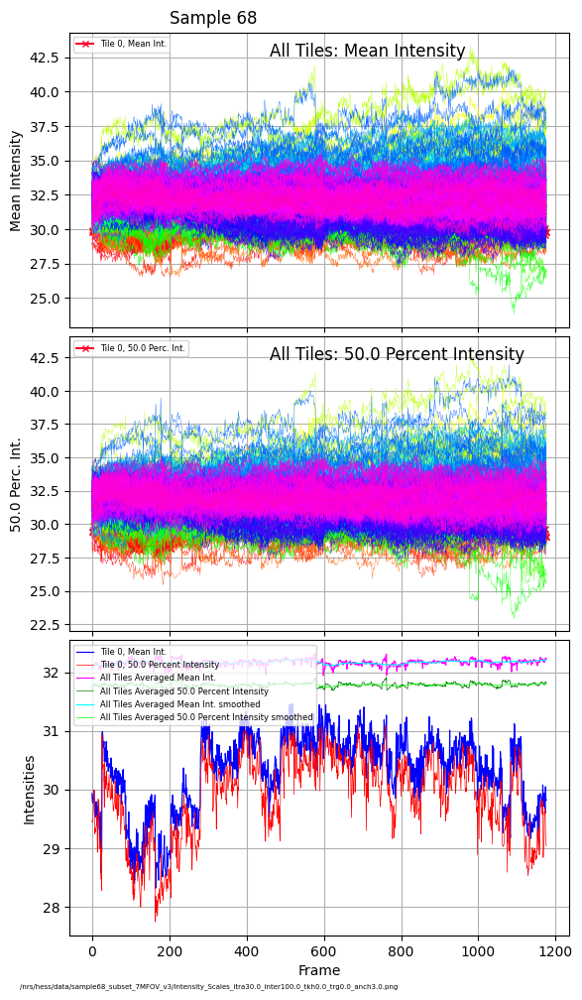

In [18]:
%%time

fit_params = ['SG', 101, 3]
tile_scale_update_source = 'aims'
save_fname = os.path.join(data_dir, 'Intensity_Scales_itra{:.1f}_inter{:.1f}_tkh{:.1f}_trg{:.1f}_anch{:.1f}.png'.format(intralayer_weight, interlayer_weight, tikhonov_damp, target_damp, anchor_damp))

int_res = test_stack.generate_intensity_report(fit_params = fit_params,
                                    tile_scale_update_source = tile_scale_update_source,
                                     save_fname = save_fname,
                                     save_png = True,
                                    verbose = True)

In [19]:
%%time

print(test_stack.percentile)

intralayer_weight = 30.0
interlayer_weight = 100.0
tikhonov_damp = 0.0
target_damp = 0.0
anchor_damp = 10.0

tile_scales_overlaps = test_stack.solve_intensity_normalization(method='overlap_percentile',
                                                                    intralayer_weight = intralayer_weight,
                                                                    interlayer_weight = interlayer_weight,
                                                                    tikhonov_damp = tikhonov_damp,
                                                                    target_damp = target_damp,
                                                                    anchor_damp = anchor_damp,          
                                                                    verbose = True)

50
2026/07/08  18:07:16   solve_intensity_normalization: rebuilt A_csr for intralayer_weight=30, interlayer_weight=100
Per-tile anchor: stacking 749749 anchor rows (anchor_damp=10, source=frame_percentile, degree_weighted=True)
Intensity normalization method: overlap_percentile
Intensity normalization parameters (tikhonov_damp=0, target_damp=0, anchor_damp=10): intralayer_weight=30.0000, interlayer_weight=100.0000
Intensity scale factors: min=0.5003, max=2.8198, std=0.1367
CPU times: user 5min 27s, sys: 115 ms, total: 5min 27s
Wall time: 5.54 s


2026/07/08  18:07:21   Using fit_params:  SG 101 3
Generating Plot
CPU times: user 9.59 s, sys: 93.7 ms, total: 9.68 s
Wall time: 4.81 s


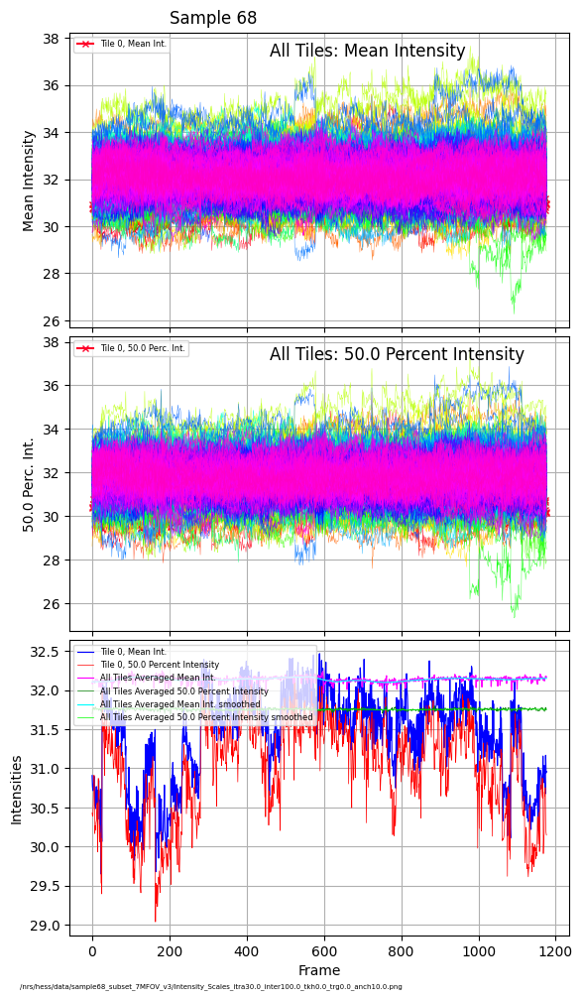

In [20]:
%%time

fit_params = ['SG', 101, 3]
tile_scale_update_source = 'aims'
save_fname = os.path.join(data_dir, 'Intensity_Scales_itra{:.1f}_inter{:.1f}_tkh{:.1f}_trg{:.1f}_anch{:.1f}.png'.format(intralayer_weight, interlayer_weight, tikhonov_damp, target_damp, anchor_damp))

int_res = test_stack.generate_intensity_report(fit_params = fit_params,
                                    tile_scale_update_source = tile_scale_update_source,
                                     save_fname = save_fname,
                                     save_png = True,
                                    verbose = True)

In [21]:
layer_id = 105

snapshot_fname = os.path.join(data_dir, 'layer{:d}_registered_intensity_normalized_snapshot.png'.format(layer_id))
dat_fname = snapshot_fname.replace('_snapshot.png', '.dat')
image_fname = snapshot_fname.replace('_snapshot.png', '_v3e_SIFT_itra{:.1f}_inter{:.1f}_tkh{:.1f}_trg{:.1f}_anch{:.1f}_wgrid.jpg'.format(intralayer_weight, interlayer_weight, tikhonov_damp, target_damp, anchor_damp))

with Client() as client:
    layer_mosaic, layer_id = test_stack.assemble_layer_mosaic(layer_id,
                                        DASK_client =client,
                                        thr_min=0.41,
                                        overlay_tile_grid = True,
                                        add_tile_ids = True,
                                        tile_id_fontsize = 6,
                                        verbose = False,
                                        perform_intensity_normalization=True,
                                        save_snapshot = False,                                                 
                                        snapshot_fname = snapshot_fname,
                                        save_to_dat = False,
                                        dat_fname = dat_fname,
                                        save_images = True,
                                        image_fname = image_fname,
                                        dpi = 1200)

2026/07/08  18:07:31  assemble_layer_mosaic:  DASK client exists. Will perform distributed computations
Use http://h07u26.int.janelia.org:8787/status to monitor DASK progress


Assembling RawImageA mosaic layer:   0%|          | 0/637 [00:00<?, ?it/s]

Detector:, data range: vmin=55.90, vmax=77.75


In [22]:
layer_id = 150

snapshot_fname = os.path.join(data_dir, 'layer{:d}_registered_intensity_normalized_snapshot.png'.format(layer_id))
dat_fname = snapshot_fname.replace('_snapshot.png', '.dat')
image_fname = snapshot_fname.replace('_snapshot.png', '_v3e_SIFT_itra{:.1f}_inter{:.1f}_tkh{:.1f}_trg{:.1f}_anch{:.1f}_wgrid.jpg'.format(intralayer_weight, interlayer_weight, tikhonov_damp, target_damp, anchor_damp))

with Client() as client:
    layer_mosaic, layer_id = test_stack.assemble_layer_mosaic(layer_id,
                                        DASK_client =client,
                                        thr_min=0.41,
                                        overlay_tile_grid = True,
                                        add_tile_ids = True,
                                        tile_id_fontsize = 6,
                                        verbose = False,
                                        perform_intensity_normalization=True,
                                        save_snapshot = False,                                                 
                                        snapshot_fname = snapshot_fname,
                                        save_to_dat = False,
                                        dat_fname = dat_fname,
                                        save_images = True,
                                        image_fname = image_fname,
                                        dpi = 1200)

2026/07/08  18:13:36  assemble_layer_mosaic:  DASK client exists. Will perform distributed computations
Use http://h07u26.int.janelia.org:8787/status to monitor DASK progress


Assembling RawImageA mosaic layer:   0%|          | 0/637 [00:00<?, ?it/s]

Detector:, data range: vmin=54.91, vmax=80.71


In [23]:
%%time

data_dir = '/nrs/hess/data/sample68_subset_7MFOV_v3'
dump_filename = '/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3e.bin'
dump_f = test_stack.save_parameters(dump_filename = dump_filename)
print(time.strftime('%Y/%m/%d  %H:%M:%S')+'   Dataset Object Data saved into binary dump file:')
print(dump_filename)

2026/07/08  18:21:20   Dataset Object Data saved into binary dump file:
/nrs/hess/data/sample68_subset_7MFOV_v3/sample68_params_v3e.bin
CPU times: user 42.6 s, sys: 4.58 s, total: 47.2 s
Wall time: 48.9 s


In [24]:
%%time

dst_path  = '/nrs/hess/data_external/MSEM/sample68_subset_7MFOV_v3e_SIFT20_perc50_intra30_inter100_tkh0_trg0_anch10.zarr'

ncpus = 2
processes = 1
threads = 1
min_workers = 200
max_workers = 1000
walltime = '23:59'

with janelia_lsf_cluster(ncpus=ncpus,              # ncpus per bsub job
                         processes=processes,      # number of workers contained in each bsub job
                         threads=threads,          # number of concurrent tasks a worker can process at once
                         min_workers=min_workers,  # minimum number of bsub jobs to maintain
                         max_workers=max_workers,
                         walltime = walltime,
                         job_script_prologue=[
                                            "export OMP_NUM_THREADS=1",
                                            "export MKL_NUM_THREADS=1",
                                            "export NUM_MKL_THREADS=1",
                                            "export OPENBLAS_NUM_THREADS=1",
                                            "export NUMPY_OPENBLAS_NUM_THREADS=1",
                                            "export SCIPY_OPENBLAS_NUM_THREADS=1",
                                            "export OPENMP_NUM_THREADS=1",
                                            "export NUMEXPR_NUM_THREADS=1",
                                            "export OPENCV_NUM_THREADS=1"],
                         config={'distributed.worker.memory.recent-to-old-time':'600s',
                                 'distributed.scheduler.worker-ttl': None}) as cluster:
    result = test_stack.save_stack_zarr3(
        DASK_client=cluster.client,
        output_zarr_path  = dst_path,
        zarr_dataset_name = 'sample68_subset_7MFOV_v3e_SIFT20C_perc50_intra30_inter100_tkh0_trg0_anch10',
        dtp = np.uint8,
        fill_value = 0,
        U8_range = [47.0, 87.0],
        perform_intensity_normalization = True,
        n_pyramid_levels  = 6,
        voxel_size_zyx = (24.0, 8.0, 8.0),
        chunk_size        = (32, 256, 256),
        shard_size        = (32, 256, 256),
        axis_order        = 'zyx',       # source is zyx, z outermost → xy-slice chunks contiguous for coalescing
        #transpose_codec   = True,        # F-order bytes inside inner chunks
        compression       = 'zstd',
        neuroglancer_serve_base_url = "https://s3.janelia.org/hess-lab/MSEM",
        compression_level = 3,
        verbose=True,
    )

Cluster dashboard link:  http://10.36.107.36:8787/status
Cluster adapting between 200 and 1000 workers with 2 cores per worker
*** This cluster has an upper bound cost of 140.0 dollars per hour ***
2026/07/08  18:21:20  save_stack_zarr3:  DASK client exists. Will perform distributed computations
Use http://h07u26.int.janelia.org:8787/status to monitor DASK progress
The output stack (axis_order='zyx') will have voxel size: (24.0, 8.0, 8.0)
  Pre-allocated s0  shape=(1177, 53653, 55922)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s1  shape=(588, 26826, 27961)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s2  shape=(294, 13413, 13980)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s3  shape=(147, 6706, 6990)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s4  shape=(73, 3353, 3495)  chunks=(32, 256, 256)  shards=(32, 256, 256)
  Pre-allocated s5  shape=(36, 1676, 1747)  chunks=(32, 256, 256)  shards=(32, 256, 256)

2026/07/08 

Writing s0 (DASK batches):   0%|          | 0/18 [00:00<?, ?it/s]

2026/07/08  18:21:31   Submitting s0 batch 1: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 78.64 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 1):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  18:40:55   Submitting s0 batch 2: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 79.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 2):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  19:03:32   Submitting s0 batch 3: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 79.37 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 3):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  19:25:49   Submitting s0 batch 4: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 80.75 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 4):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  19:50:33   Submitting s0 batch 5: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.34 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 5):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  20:14:35   Submitting s0 batch 6: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 81.60 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 6):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  20:36:51   Submitting s0 batch 7: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 81.99 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 7):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  21:00:55   Submitting s0 batch 8: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.79 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 8):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  21:24:48   Submitting s0 batch 9: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.66 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 9):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  22:07:28   Submitting s0 batch 10: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.73 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 10):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  22:31:58   Submitting s0 batch 11: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.05 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 11):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  22:55:30   Submitting s0 batch 12: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 81.61 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 12):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  23:18:44   Submitting s0 batch 13: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.22 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 13):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/08  23:41:51   Submitting s0 batch 14: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.69 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 14):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/09  00:05:33   Submitting s0 batch 15: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.65 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 15):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/09  00:29:55   Submitting s0 batch 16: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 82.69 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 16):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/09  00:54:37   Submitting s0 batch 17: 100000 shards


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 75.12 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s0 shards (batch 17):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/09  01:20:35   Submitting s0 batch 18: 1630 shards


  s0 shards (batch 18):   0%|          | 0/1630 [00:00<?, ?it/s]


2026/07/09  01:21:05   Building s1:  219450 shards from s0


Downsampling to s1 (DASK batches):   0%|          | 0/3 [00:00<?, ?it/s]

2026/07/09  01:21:05   Submitting s1 batch 1/3: shards [0, 100000)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 15.11 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s1 shards (batch 1/3):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/09  01:26:11   Submitting s1 batch 2/3: shards [100000, 200000)


/groups/hess/home/shtengelg/anaconda3/lib/python3.12/site-packages/distributed/client.py:3398: UserWarning: Sending large graph of size 15.35 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


  s1 shards (batch 2/3):   0%|          | 0/100000 [00:00<?, ?it/s]

2026/07/09  01:31:28   Submitting s1 batch 3/3: shards [200000, 219450)


  s1 shards (batch 3/3):   0%|          | 0/19450 [00:00<?, ?it/s]


2026/07/09  01:32:36   Building s2:  29150 shards from s1


Downsampling to s2 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/09  01:32:36   Submitting s2 batch 1/1: shards [0, 29150)


  s2 shards (batch 1/1):   0%|          | 0/29150 [00:00<?, ?it/s]


2026/07/09  01:34:19   Building s3:  3780 shards from s2


Downsampling to s3 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/09  01:34:19   Submitting s3 batch 1/1: shards [0, 3780)


  s3 shards (batch 1/1):   0%|          | 0/3780 [00:00<?, ?it/s]


2026/07/09  01:34:30   Building s4:  588 shards from s3


Downsampling to s4 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/09  01:34:30   Submitting s4 batch 1/1: shards [0, 588)


  s4 shards (batch 1/1):   0%|          | 0/588 [00:00<?, ?it/s]


2026/07/09  01:34:35   Building s5:  98 shards from s4


Downsampling to s5 (DASK batches):   0%|          | 0/1 [00:00<?, ?it/s]

2026/07/09  01:34:35   Submitting s5 batch 1/1: shards [0, 98)


  s5 shards (batch 1/1):   0%|          | 0/98 [00:00<?, ?it/s]


2026/07/09  01:34:35   save_stack_zarr3 done in 433.3 min

Neuroglancer — how to view (zarr v3)
  Serve:  python -m http.server 9000 --directory /nrs/hess/data_external/MSEM
  Source: https://s3.janelia.org/hess-lab/MSEM/sample68_subset_7MFOV_v3e_SIFT20_perc50_intra30_inter100_tkh0_trg0_anch10.zarr/|zarr3:

  Link:   https://neuroglancer-demo.appspot.com/#!%7B%22layers%22%3A%20%5B%7B%22type%22%3A%20%22image%22%2C%20%22source%22%3A%20%22https%3A//s3.janelia.org/hess-lab/MSEM/sample68_subset_7MFOV_v3e_SIFT20_perc50_intra30_inter100_tkh0_trg0_anch10.zarr/%7Czarr3%3A%22%2C%20%22tab%22%3A%20%22source%22%2C%20%22name%22%3A%20%22sample68_subset_7MFOV_v3e_SIFT20C_perc50_intra30_inter100_tkh0_trg0_anch10%22%7D%5D%2C%20%22selectedLayer%22%3A%20%7B%22visible%22%3A%20true%2C%20%22layer%22%3A%20%22sample68_subset_7MFOV_v3e_SIFT20C_perc50_intra30_inter100_tkh0_trg0_anch10%22%7D%2C%20%22layout%22%3A%20%224panel-alt%22%2C%20%22displayDimensions%22%3A%20%5B%22z%22%2C%20%22y%22%2C%20%22x%22%5D%7D
CPU t

# Concluding notes:

## Original processing, with solve parameters:

    Positional Solve:
    method = SIFT
    intralayer_weight = 3.0
    interlayer_weight = 100.0

    Intensity Solve:
    method = 'overlap_percentile'
    intralayer_weight = 3.0
    interlayer_weight = 100.0
    tikhonov_damp = 0.0
    target_damp = 1.0
    anchor_damp = 0.0

https://neuroglancer-demo.appspot.com/#!%7B%22dimensions%22:%7B%22z%22:%5B2.4000000000000003e-8%2C%22m%22%5D%2C%22y%22:%5B8e-9%2C%22m%22%5D%2C%22x%22:%5B8e-9%2C%22m%22%5D%7D%2C%22displayDimensions%22:%5B%22x%22%2C%22y%22%2C%22z%22%5D%2C%22position%22:%5B105%2C29089.36328125%2C31057.00390625%5D%2C%22crossSectionScale%22:2.3564184423836645%2C%22projectionScale%22:65536%2C%22layers%22:%5B%7B%22type%22:%22image%22%2C%22source%22:%22https://s3.janelia.org/hess-lab/MSEM/sample68_subset_7MFOV_v3c_SIFT20_perc50_intra3_inter100_tkh0_trg0.zarr/%7Czarr3:%22%2C%22tab%22:%22rendering%22%2C%22shaderControls%22:%7B%22normalized%22:%7B%22range%22:%5B181%2C64%5D%7D%7D%2C%22name%22:%22sample68_subset_7MFOV_v3c_SIFT20C_perc50_intra3_inter100_tkh0_trg0%22%7D%5D%2C%22selectedLayer%22:%7B%22visible%22:true%2C%22layer%22:%22sample68_subset_7MFOV_v3c_SIFT20C_perc50_intra3_inter100_tkh0_trg0%22%7D%2C%22layout%22:%224panel-alt%22%7D


## Improved processing, with solve parameters:

    Positional Solve:
    method = SIFT
    intralayer_weight = 30.0
    interlayer_weight = 100.0
    
    Intensity Solve:
    method = 'overlap_percentile'
    intralayer_weight = 30.0
    interlayer_weight = 100.0
    tikhonov_damp = 0.0
    target_damp = 0.0
    anchor_damp = 10.0

https://neuroglancer-demo.appspot.com/#!%7B%22dimensions%22:%7B%22z%22:%5B2.4000000000000003e-8%2C%22m%22%5D%2C%22y%22:%5B8e-9%2C%22m%22%5D%2C%22x%22:%5B8e-9%2C%22m%22%5D%7D%2C%22displayDimensions%22:%5B%22x%22%2C%22y%22%2C%22z%22%5D%2C%22position%22:%5B105%2C29089%2C31057%5D%2C%22crossSectionScale%22:1.9019071442186504%2C%22projectionScale%22:65536%2C%22layers%22:%5B%7B%22type%22:%22image%22%2C%22source%22:%22https://s3.janelia.org/hess-lab/MSEM/sample68_subset_7MFOV_v3e_SIFT20_perc50_intra30_inter100_tkh0_trg0_anch10.zarr/%7Czarr3:%22%2C%22tab%22:%22rendering%22%2C%22shaderControls%22:%7B%22normalized%22:%7B%22range%22:%5B173%2C43%5D%7D%7D%2C%22name%22:%22sample68_subset_7MFOV_v3e_SIFT20C_perc50_intra30_inter100_tkh0_trg0_anch10%22%7D%5D%2C%22selectedLayer%22:%7B%22visible%22:true%2C%22layer%22:%22sample68_subset_7MFOV_v3e_SIFT20C_perc50_intra30_inter100_tkh0_trg0_anch10%22%7D%2C%22layout%22:%224panel-alt%22%7D